In [1]:
import os
import glob as glob
import timecorr as tc
import hypertools as hyp
import numpy as np
import pandas as pd
from scipy.io import loadmat
from scipy.spatial.distance import pdist, cdist, squareform
from sklearn.decomposition import PCA, IncrementalPCA
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline  
import timecorr as tc
from timecorr.helpers import isfc, wisfc, mean_combine, corrmean_combine
import supereeg as se

In [2]:
def rbf(centers, widths, locs):
    """
    Radial basis function
    Parameters
    ----------
    centers : ndarray
        rbf coordinates (one row per RBF)
    widths : ndarray
        RBF radii
    locs : ndarray
        locations to evaluate the RBFs (one row per location)
        
    Returns
    ----------
    results : ndarray
        Matrix of RBF weights for each RBF (row), at each location (column)
    """    
    weights = np.exp(np.divide(-cdist(locs, centers, metric='euclidean') ** 2, np.tile(np.array(widths, ndmin=2), [locs.shape[0], 1])))
    return weights.T

In [3]:
def largest_indices(ary, n):
    """Returns the n largest indices from a numpy array."""
    flat = ary.flatten()
    indices = np.argpartition(flat, -n)[-n:]
    indices = indices[np.argsort(-flat[indices])]
    return np.unravel_index(indices, ary.shape)

In [4]:
def reduce_list(x, model):
    split = np.cumsum([len(xi) for xi in x])[:-1]
    x_r = np.vsplit(model.fit_transform(np.vstack(x)), split)
    if len(x) > 1:
        return [xi for xi in x_r]
    else:
        return [x_r[0]]

In [5]:
datadir = os.path.join(os.getenv('HOME'), 'Desktop', 'pca_env', 'pca_paper', 'pieman', 'data')


In [6]:
figdir = '../figs'
if not os.path.exists(figdir):
    os.mkdir(figdir)

In [7]:
nii_bo_dir = '../../data/niis'

In [8]:
pca_nii_bo_dir = os.path.join(nii_bo_dir, 'pcas')
if not os.path.exists(pca_nii_bo_dir):
    os.makedirs(pca_nii_bo_dir)

In [9]:
neurosynth_dir ='../figs/neurosynth_data/'
if not os.path.exists(neurosynth_dir):
    os.mkdir(neurosynth_dir)

In [10]:
n_f_dir = os.path.join(neurosynth_dir, 'figs')
if not os.path.exists(n_f_dir):
    os.mkdir(n_f_dir)
nii_dir = os.path.join(neurosynth_dir, 'niis')
if not os.path.exists(nii_dir):
    os.mkdir(nii_dir)
txt_dir = os.path.join(neurosynth_dir, 'txts')
if not os.path.exists(txt_dir):
    os.mkdir(txt_dir)
p_txt_dir = os.path.join(txt_dir, 'parsed_txts')
if not os.path.exists(p_txt_dir):
    os.mkdir(p_txt_dir)

In [11]:
ddir = '../../data/'

In [12]:
#figdir = '/Users/lucyowen/Desktop/timecorr_env/timecorr_paper/pieman/figs'

In [13]:
#results_dir = os.path.join(os.getenv('HOME'), 'Desktop', 'timecorr_env', 'timecorr_paper', 'pieman', 'results')
results_dir = os.path.join('../../data/', 'results')

In [14]:
posterior = loadmat(os.path.join(ddir, 'pieman_posterior_K700.mat'))
centers = posterior['posterior']['centers'][0][0][0][0][0]
widths = np.array(list(posterior['posterior']['widths'][0][0][0][0][0][:, 0].T))

In [15]:
template = se.helpers._std(res=2)

In [16]:
factors=700

In [17]:
if factors == 100:
    pieman_name = '../../data/pieman_ica100.mat'
else:
    pieman_name = '../../data/pieman_data.mat'

pieman_conds = ['intact', 'paragraph', 'word', 'rest']

In [18]:
pieman_data = loadmat(pieman_name)

In [19]:
debug = False

In [21]:
chunks = 3

In [34]:
pieman_data = loadmat(pieman_name)

if debug:
    data_chunks = [0] * 3
    conds_chunks = [0] * 3
    divided = 0
    for third in list(range(3)):
        data = []
        conds = []
        for c in pieman_conds:
            next_data = list(map(lambda i: pieman_data[c][:, i][0][divided:divided+10,:20], np.arange(4)))
            data.extend(next_data)
            conds.extend([c]*len(next_data))

        conds_chunks[third] = conds
        data_chunks[third] = data
        divided += 10

    del pieman_data
else:

    data_chunks = [0] * 3
    conds_chunks = [0] * 3
    for third in list(range(3)):
        data = []
        conds = []
        for c in pieman_conds:
            timechunk = int(np.round(pieman_data[c][0][0].shape[0]/3, 0))
            divided = third * timechunk
            if c == 'paragraph':
                if factors == 700:
                    next_data = list(
                        map(lambda i: pieman_data[c][:, i][0][divided:divided+timechunk,:], np.where(np.arange(pieman_data[c].shape[1]) != 3)[0]))
                else:
                    next_data = list(
                        map(lambda i: pieman_data[c][:, i][0][divided:divided+timechunk,:], np.where(np.arange(pieman_data[c].shape[1]) != 0)[0]))
            else:
                next_data = list(map(lambda i: pieman_data[c][:, i][0][divided:divided+timechunk,:], np.arange(pieman_data[c].shape[1])))
            print(np.shape(next_data))
            data.extend(next_data)
            conds.extend([c]*len(next_data))

        conds_chunks[third] = conds
        data_chunks[third] = data

    del pieman_data


(36, 100, 700)
(17, 91, 700)
(36, 100, 700)
(36, 133, 700)
(36, 100, 700)
(17, 91, 700)
(36, 100, 700)
(36, 133, 700)
(36, 100, 700)
(17, 90, 700)
(36, 100, 700)
(36, 133, 700)


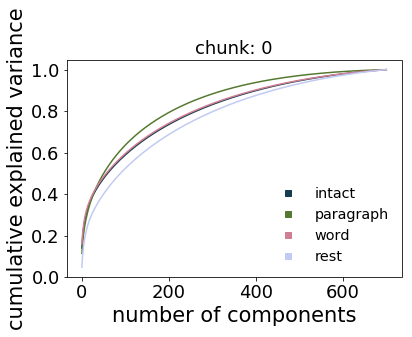

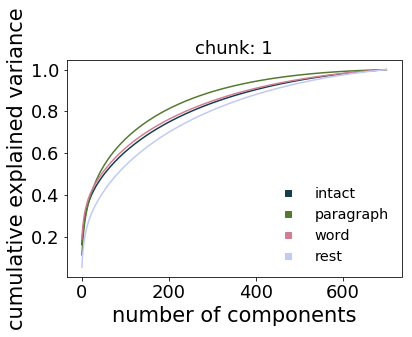

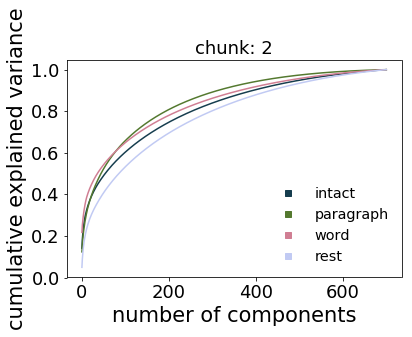

<Figure size 432x288 with 0 Axes>

In [35]:

for chunk in range(chunks):
    data = np.array(data_chunks[chunk])
    conds = np.array(conds_chunks[chunk])
    
    conditions = ['intact', 'paragraph', 'word', 'rest']
    colors = sns.color_palette("cubehelix", 4)

    for e, c in enumerate(conditions):
        x = list(data[conds == c])
        split = np.cumsum([len(xi) for xi in x])[:-1]

        pca = IncrementalPCA(n_components=np.shape(x)[2])
        x_r = np.vsplit(pca.fit_transform(np.vstack(x)), split)

        plt.plot(np.cumsum(pca.explained_variance_ratio_), color = colors[e])
        plt.xlabel('number of components')
        plt.ylabel('cumulative explained variance')
        plt.title('chunk: ' + str(chunk))

    f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
    legend = plt.legend([f("s", colors[i]) for i in range(4)], conditions, loc=4, framealpha=1, frameon=False, fontsize = 'x-large')
    
    plt.show()
    plt.clf()

# Make scree plot for first 5 components

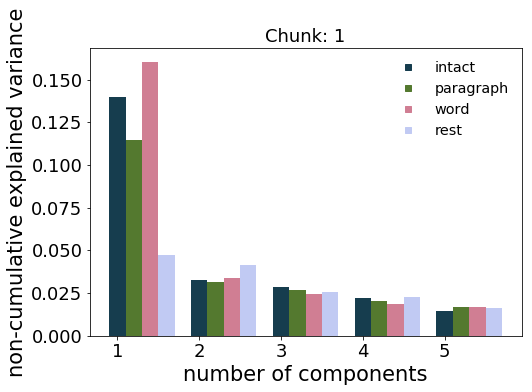

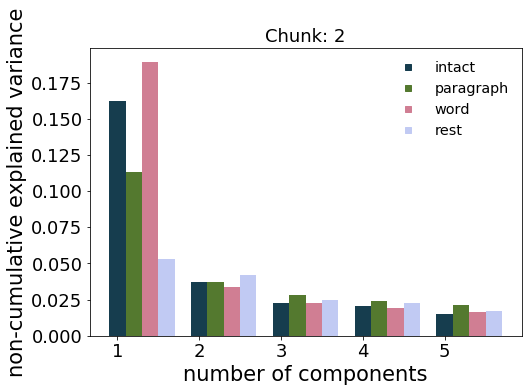

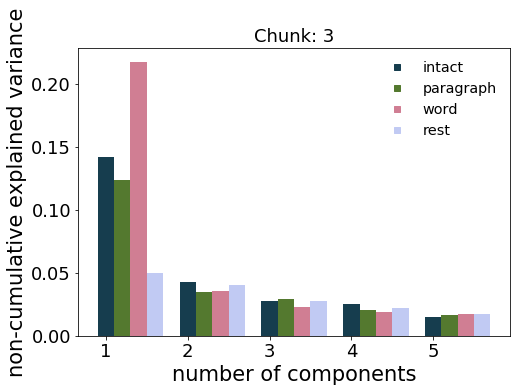

In [36]:
for chunk in range(chunks):
    data = np.array(data_chunks[chunk])
    conds = np.array(conds_chunks[chunk])
    
    conditions = ['intact', 'paragraph', 'word', 'rest']
    colors = sns.color_palette("cubehelix", 4)

    fig = plt.figure()
    ax = fig.add_axes([0,0,1,1])
    X = np.arange(5)
    x_new = 0 
    for e, c in enumerate(conditions):

        x = list(data[conds == c])
        split = np.cumsum([len(xi) for xi in x])[:-1]

        pca = IncrementalPCA(n_components=np.shape(x)[2])
        x_r = np.vsplit(pca.fit_transform(np.vstack(x)), split)


        ax.bar(X + 1 + x_new, pca.explained_variance_ratio_[:5], color = colors[e], width = 0.2)
        #plt.plot(pca.explained_variance_ratio_, color = colors[e])
        plt.xlabel('number of components')
        plt.ylabel('non-cumulative explained variance')
        plt.title('Chunk: ' + str(chunk + 1))
        x_new += 0.2

    f = lambda m,c: plt.plot([],[],marker=m, color=c, ls="none")[0]
    legend = plt.legend([f("s", colors[i]) for i in range(4)], conditions, loc=1, framealpha=1, frameon=False, fontsize = 'x-large')


# Plot cumulative variance explained by number of components for each condition and chunk


In [37]:
conditions = ['intact', 'paragraph', 'word', 'rest']
#conditions = ['intact']
colors = sns.color_palette("cubehelix", 4)

full_pca_data = pd.DataFrame()
for e, c in enumerate(conditions):
    
    for p in np.arange(data[conds == c].shape[0]):
    
        x = data[conds == c][p]
        #split = np.cumsum([len(xi) for xi in x])[:-1]

        pca = PCA(n_components=700)
        pca.fit_transform(x)
        #x_r = np.vsplit(pca.fit_transform(np.vstack(x)), split)

#         plt.plot(np.cumsum(pca.explained_variance_ratio_), color = colors[e])
#         plt.xlabel('number of components')
#         plt.ylabel('cumulative explained variance')


        pc_data = pd.DataFrame()
        pc_data['variance'] = np.cumsum(pca.explained_variance_ratio_)
        pc_data['condition'] = np.matlib.repmat(c, np.cumsum(pca.explained_variance_ratio_).shape[0], 1)
        pc_data['subject'] = np.matlib.repmat(p, np.cumsum(pca.explained_variance_ratio_).shape[0], 1)
        pc_data['components'] = pc_data.index +1 
        if full_pca_data.empty:
            full_pca_data = pc_data
        else:
            full_pca_data = full_pca_data.append(pc_data)

In [38]:
sub_nii = se.load('std', vox_size=4)
sub_locs = sub_nii.get_locs().values

In [33]:
pca.components_

array([[ 0.0458147 ,  0.01471778,  0.03887833, ...,  0.03889117,
         0.02921795,  0.02079517],
       [ 0.02022389,  0.03591813, -0.04064646, ..., -0.00582181,
        -0.0242173 , -0.00730193],
       [-0.02679914, -0.03884656, -0.05343873, ..., -0.01769891,
        -0.01340168, -0.00413217],
       ...,
       [ 0.01082541,  0.02421339,  0.01706297, ..., -0.01034066,
         0.03715828,  0.0791343 ],
       [-0.05469768, -0.02507917, -0.03208387, ...,  0.05574548,
         0.01793489,  0.07007805],
       [ 0.01861317, -0.00580896,  0.0104461 , ...,  0.04297776,
         0.00335303,  0.00914787]])

In [32]:
np.shape(x)

(36, 300, 700)

In [31]:
np.shape(split)

(35,)

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.03986093  0.01505948  0.04083469 ...  0.03593292  0.03101923
   0.01462173]
 [ 0.03255822  0.03169506 -0.04330312 ... -0.01412217 -0.02126475
  -0.00634557]
 [-0.01640776 -0.04275656 -0.05330592 ... -0.01262333 -0.0109525
  -0.00341613]
 ...
 [-0.01435869 -0.01163526 -0.01192689 ...  0.01194751 -0.01638856
   0.00804253]
 [ 0.00909717  0.02088995 -0.02561372 ...  0.07033479  0.00079822
  -0.01605807]
 [ 0.02341034 -0.01073566 -0.00581085 ...  0.05648195 -0.01830452
   0.00680089]]


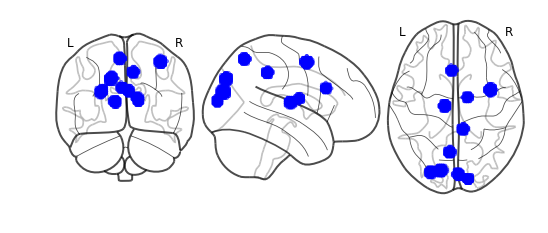

../../data/niis/pcas/intact_1_pca_chunk_1
Condition = intact; Chunk = 1; PCA = 1; Variance explained = 0.14


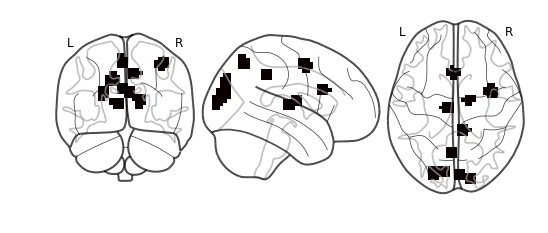

[[ 0.03986093  0.01505948  0.04083469 ...  0.03593292  0.03101923
   0.01462173]
 [ 0.03255822  0.03169506 -0.04330312 ... -0.01412217 -0.02126475
  -0.00634557]
 [-0.01640776 -0.04275656 -0.05330592 ... -0.01262333 -0.0109525
  -0.00341613]
 ...
 [-0.01435869 -0.01163526 -0.01192689 ...  0.01194751 -0.01638856
   0.00804253]
 [ 0.00909717  0.02088995 -0.02561372 ...  0.07033479  0.00079822
  -0.01605807]
 [ 0.02341034 -0.01073566 -0.00581085 ...  0.05648195 -0.01830452
   0.00680089]]


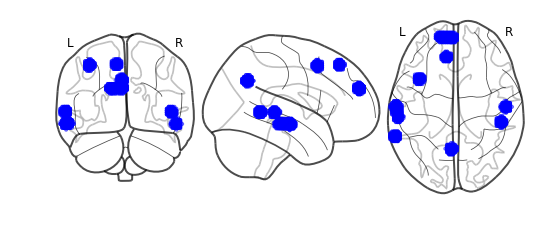

../../data/niis/pcas/intact_2_pca_chunk_1
Condition = intact; Chunk = 1; PCA = 2; Variance explained = 0.03


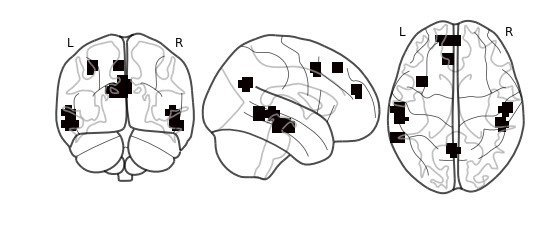

[[ 0.03986093  0.01505948  0.04083469 ...  0.03593292  0.03101923
   0.01462173]
 [ 0.03255822  0.03169506 -0.04330312 ... -0.01412217 -0.02126475
  -0.00634557]
 [-0.01640776 -0.04275656 -0.05330592 ... -0.01262333 -0.0109525
  -0.00341613]
 ...
 [-0.01435869 -0.01163526 -0.01192689 ...  0.01194751 -0.01638856
   0.00804253]
 [ 0.00909717  0.02088995 -0.02561372 ...  0.07033479  0.00079822
  -0.01605807]
 [ 0.02341034 -0.01073566 -0.00581085 ...  0.05648195 -0.01830452
   0.00680089]]


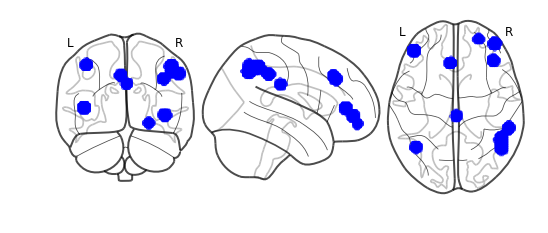

../../data/niis/pcas/intact_3_pca_chunk_1
Condition = intact; Chunk = 1; PCA = 3; Variance explained = 0.03


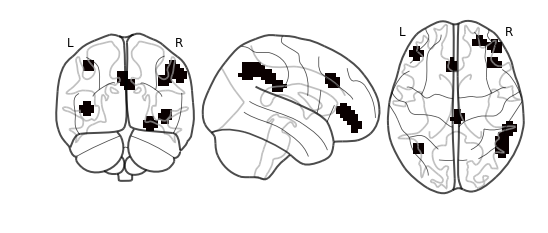

[[ 0.03986093  0.01505948  0.04083469 ...  0.03593292  0.03101923
   0.01462173]
 [ 0.03255822  0.03169506 -0.04330312 ... -0.01412217 -0.02126475
  -0.00634557]
 [-0.01640776 -0.04275656 -0.05330592 ... -0.01262333 -0.0109525
  -0.00341613]
 ...
 [-0.01435869 -0.01163526 -0.01192689 ...  0.01194751 -0.01638856
   0.00804253]
 [ 0.00909717  0.02088995 -0.02561372 ...  0.07033479  0.00079822
  -0.01605807]
 [ 0.02341034 -0.01073566 -0.00581085 ...  0.05648195 -0.01830452
   0.00680089]]


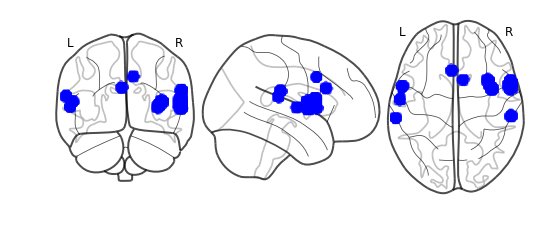

../../data/niis/pcas/intact_4_pca_chunk_1
Condition = intact; Chunk = 1; PCA = 4; Variance explained = 0.02


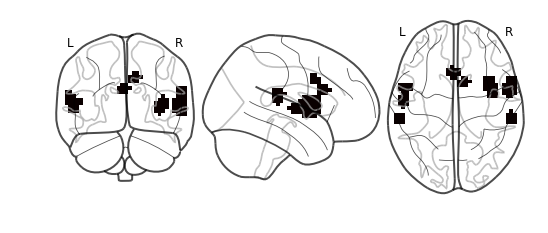

[[ 0.03986093  0.01505948  0.04083469 ...  0.03593292  0.03101923
   0.01462173]
 [ 0.03255822  0.03169506 -0.04330312 ... -0.01412217 -0.02126475
  -0.00634557]
 [-0.01640776 -0.04275656 -0.05330592 ... -0.01262333 -0.0109525
  -0.00341613]
 ...
 [-0.01435869 -0.01163526 -0.01192689 ...  0.01194751 -0.01638856
   0.00804253]
 [ 0.00909717  0.02088995 -0.02561372 ...  0.07033479  0.00079822
  -0.01605807]
 [ 0.02341034 -0.01073566 -0.00581085 ...  0.05648195 -0.01830452
   0.00680089]]


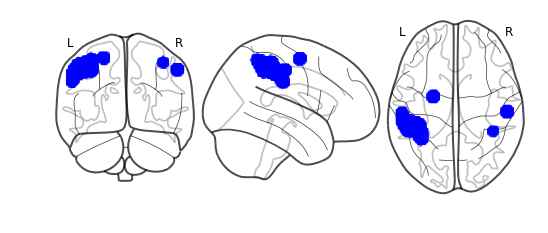

../../data/niis/pcas/intact_5_pca_chunk_1
Condition = intact; Chunk = 1; PCA = 5; Variance explained = 0.01


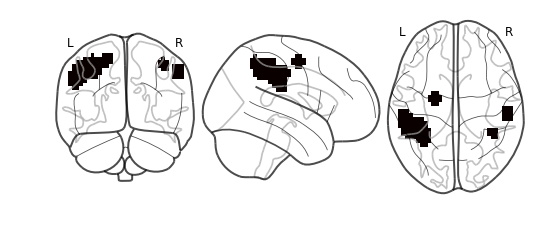

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.05396809  0.0229876   0.03316813 ...  0.03060937  0.03115163
   0.02727861]
 [-0.00748645  0.00621207 -0.06420459 ...  0.01538066 -0.05122943
   0.03223653]
 [ 0.0249646   0.03688972  0.00437217 ... -0.00148546 -0.05395208
  -0.02085694]
 ...
 [ 0.00929342 -0.0031827   0.06513609 ... -0.00299077  0.0277395
  -0.01526641]
 [-0.02707142 -0.01411842  0.02463004 ...  0.05699513 -0.05980778
  -0.00627274]
 [ 0.01596668  0.03058679 -0.0111844  ...  0.05826556 -0.01328971
   0.01202887]]


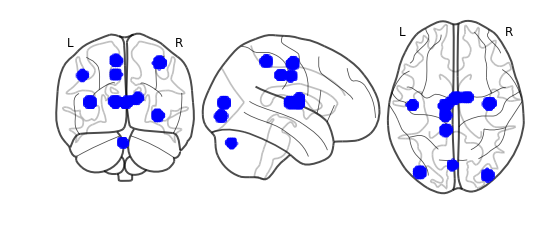

../../data/niis/pcas/paragraph_1_pca_chunk_1
Condition = paragraph; Chunk = 1; PCA = 1; Variance explained = 0.11


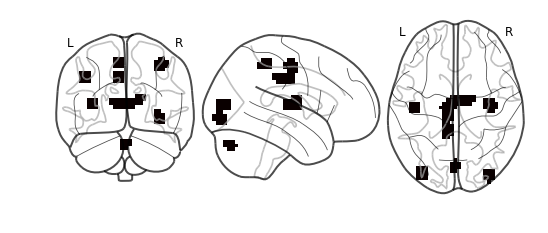

[[ 0.05396809  0.0229876   0.03316813 ...  0.03060937  0.03115163
   0.02727861]
 [-0.00748645  0.00621207 -0.06420459 ...  0.01538066 -0.05122943
   0.03223653]
 [ 0.0249646   0.03688972  0.00437217 ... -0.00148546 -0.05395208
  -0.02085694]
 ...
 [ 0.00929342 -0.0031827   0.06513609 ... -0.00299077  0.0277395
  -0.01526641]
 [-0.02707142 -0.01411842  0.02463004 ...  0.05699513 -0.05980778
  -0.00627274]
 [ 0.01596668  0.03058679 -0.0111844  ...  0.05826556 -0.01328971
   0.01202887]]


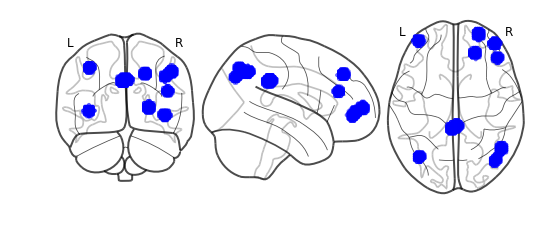

../../data/niis/pcas/paragraph_2_pca_chunk_1
Condition = paragraph; Chunk = 1; PCA = 2; Variance explained = 0.03


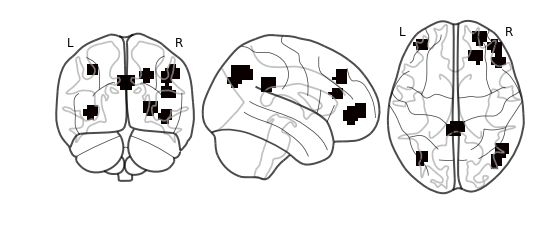

[[ 0.05396809  0.0229876   0.03316813 ...  0.03060937  0.03115163
   0.02727861]
 [-0.00748645  0.00621207 -0.06420459 ...  0.01538066 -0.05122943
   0.03223653]
 [ 0.0249646   0.03688972  0.00437217 ... -0.00148546 -0.05395208
  -0.02085694]
 ...
 [ 0.00929342 -0.0031827   0.06513609 ... -0.00299077  0.0277395
  -0.01526641]
 [-0.02707142 -0.01411842  0.02463004 ...  0.05699513 -0.05980778
  -0.00627274]
 [ 0.01596668  0.03058679 -0.0111844  ...  0.05826556 -0.01328971
   0.01202887]]


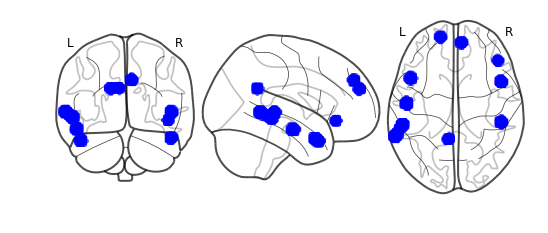

../../data/niis/pcas/paragraph_3_pca_chunk_1
Condition = paragraph; Chunk = 1; PCA = 3; Variance explained = 0.03


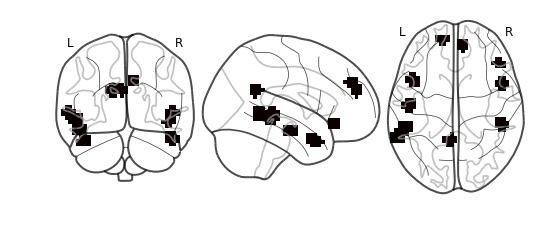

[[ 0.05396809  0.0229876   0.03316813 ...  0.03060937  0.03115163
   0.02727861]
 [-0.00748645  0.00621207 -0.06420459 ...  0.01538066 -0.05122943
   0.03223653]
 [ 0.0249646   0.03688972  0.00437217 ... -0.00148546 -0.05395208
  -0.02085694]
 ...
 [ 0.00929342 -0.0031827   0.06513609 ... -0.00299077  0.0277395
  -0.01526641]
 [-0.02707142 -0.01411842  0.02463004 ...  0.05699513 -0.05980778
  -0.00627274]
 [ 0.01596668  0.03058679 -0.0111844  ...  0.05826556 -0.01328971
   0.01202887]]


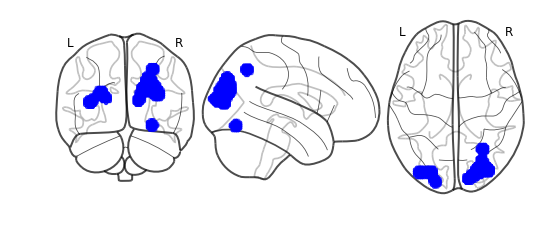

../../data/niis/pcas/paragraph_4_pca_chunk_1
Condition = paragraph; Chunk = 1; PCA = 4; Variance explained = 0.02


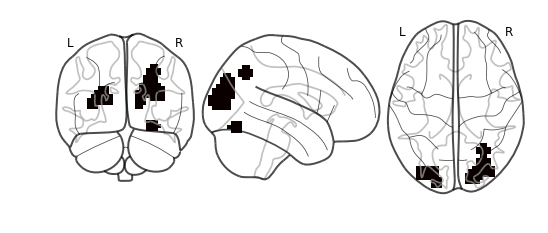

[[ 0.05396809  0.0229876   0.03316813 ...  0.03060937  0.03115163
   0.02727861]
 [-0.00748645  0.00621207 -0.06420459 ...  0.01538066 -0.05122943
   0.03223653]
 [ 0.0249646   0.03688972  0.00437217 ... -0.00148546 -0.05395208
  -0.02085694]
 ...
 [ 0.00929342 -0.0031827   0.06513609 ... -0.00299077  0.0277395
  -0.01526641]
 [-0.02707142 -0.01411842  0.02463004 ...  0.05699513 -0.05980778
  -0.00627274]
 [ 0.01596668  0.03058679 -0.0111844  ...  0.05826556 -0.01328971
   0.01202887]]


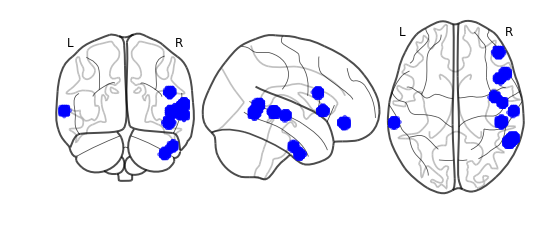

../../data/niis/pcas/paragraph_5_pca_chunk_1
Condition = paragraph; Chunk = 1; PCA = 5; Variance explained = 0.02


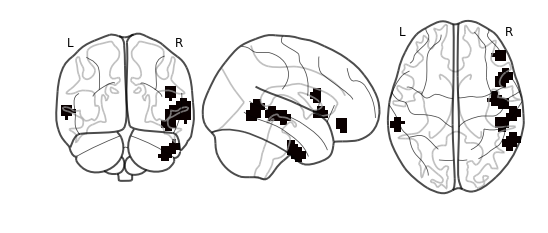

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.04331316  0.02235388  0.03742123 ...  0.0357616   0.0294591
   0.02344913]
 [ 0.0252724   0.03397601 -0.06264789 ... -0.00763909 -0.05227163
   0.00827376]
 [-0.02755988 -0.05568958  0.01577407 ... -0.070535   -0.025944
  -0.06109834]
 ...
 [-0.00307314 -0.03736205  0.04898588 ... -0.05464905  0.01162527
   0.03129044]
 [ 0.01269174  0.01389242  0.01269995 ... -0.03458678 -0.00943421
   0.02003633]
 [ 0.02917114 -0.01769588 -0.02283573 ... -0.00140234 -0.01502583
  -0.01440752]]


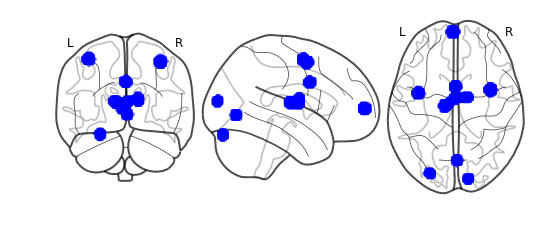

../../data/niis/pcas/word_1_pca_chunk_1
Condition = word; Chunk = 1; PCA = 1; Variance explained = 0.16


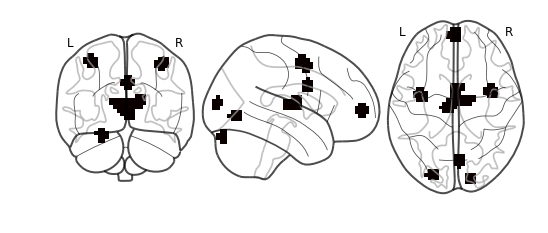

[[ 0.04331316  0.02235388  0.03742123 ...  0.0357616   0.0294591
   0.02344913]
 [ 0.0252724   0.03397601 -0.06264789 ... -0.00763909 -0.05227163
   0.00827376]
 [-0.02755988 -0.05568958  0.01577407 ... -0.070535   -0.025944
  -0.06109834]
 ...
 [-0.00307314 -0.03736205  0.04898588 ... -0.05464905  0.01162527
   0.03129044]
 [ 0.01269174  0.01389242  0.01269995 ... -0.03458678 -0.00943421
   0.02003633]
 [ 0.02917114 -0.01769588 -0.02283573 ... -0.00140234 -0.01502583
  -0.01440752]]


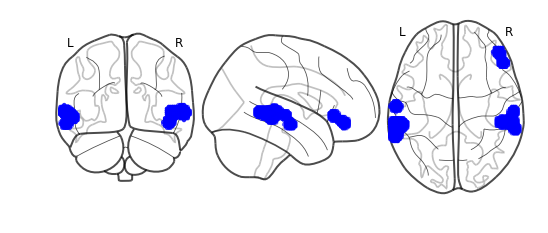

../../data/niis/pcas/word_2_pca_chunk_1
Condition = word; Chunk = 1; PCA = 2; Variance explained = 0.03


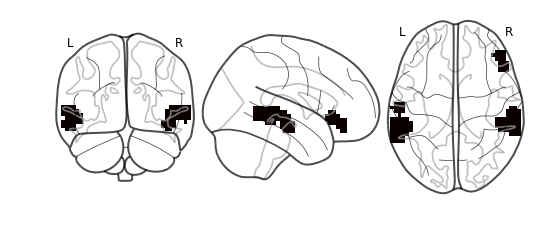

[[ 0.04331316  0.02235388  0.03742123 ...  0.0357616   0.0294591
   0.02344913]
 [ 0.0252724   0.03397601 -0.06264789 ... -0.00763909 -0.05227163
   0.00827376]
 [-0.02755988 -0.05568958  0.01577407 ... -0.070535   -0.025944
  -0.06109834]
 ...
 [-0.00307314 -0.03736205  0.04898588 ... -0.05464905  0.01162527
   0.03129044]
 [ 0.01269174  0.01389242  0.01269995 ... -0.03458678 -0.00943421
   0.02003633]
 [ 0.02917114 -0.01769588 -0.02283573 ... -0.00140234 -0.01502583
  -0.01440752]]


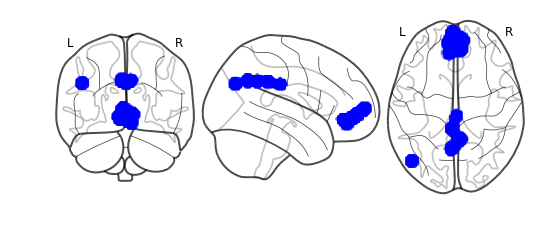

../../data/niis/pcas/word_3_pca_chunk_1
Condition = word; Chunk = 1; PCA = 3; Variance explained = 0.02


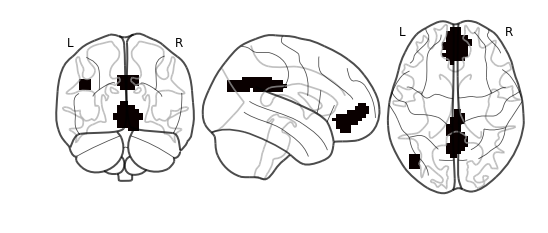

[[ 0.04331316  0.02235388  0.03742123 ...  0.0357616   0.0294591
   0.02344913]
 [ 0.0252724   0.03397601 -0.06264789 ... -0.00763909 -0.05227163
   0.00827376]
 [-0.02755988 -0.05568958  0.01577407 ... -0.070535   -0.025944
  -0.06109834]
 ...
 [-0.00307314 -0.03736205  0.04898588 ... -0.05464905  0.01162527
   0.03129044]
 [ 0.01269174  0.01389242  0.01269995 ... -0.03458678 -0.00943421
   0.02003633]
 [ 0.02917114 -0.01769588 -0.02283573 ... -0.00140234 -0.01502583
  -0.01440752]]


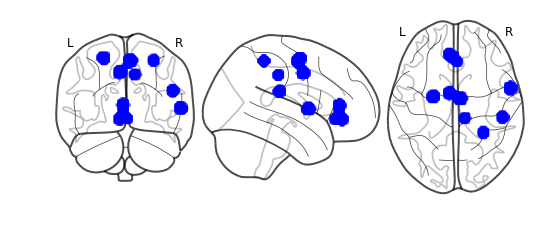

../../data/niis/pcas/word_4_pca_chunk_1
Condition = word; Chunk = 1; PCA = 4; Variance explained = 0.02


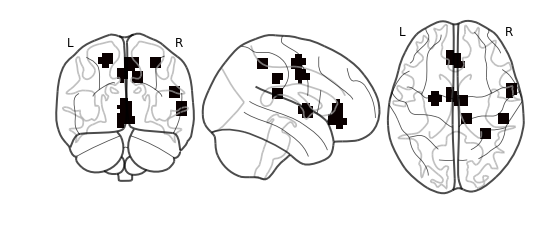

[[ 0.04331316  0.02235388  0.03742123 ...  0.0357616   0.0294591
   0.02344913]
 [ 0.0252724   0.03397601 -0.06264789 ... -0.00763909 -0.05227163
   0.00827376]
 [-0.02755988 -0.05568958  0.01577407 ... -0.070535   -0.025944
  -0.06109834]
 ...
 [-0.00307314 -0.03736205  0.04898588 ... -0.05464905  0.01162527
   0.03129044]
 [ 0.01269174  0.01389242  0.01269995 ... -0.03458678 -0.00943421
   0.02003633]
 [ 0.02917114 -0.01769588 -0.02283573 ... -0.00140234 -0.01502583
  -0.01440752]]


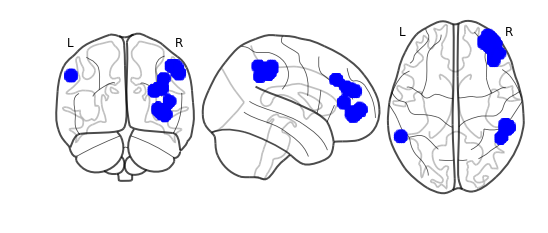

../../data/niis/pcas/word_5_pca_chunk_1
Condition = word; Chunk = 1; PCA = 5; Variance explained = 0.02


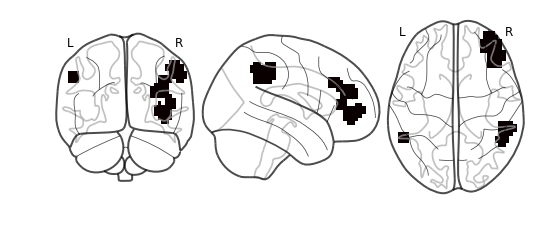

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.05084917  0.02613447  0.01294937 ...  0.05064822  0.00556602
  -0.00447757]
 [-0.00186993 -0.01195567  0.04337996 ...  0.03401246  0.05547837
   0.01964413]
 [-0.02725789 -0.00344781  0.05171722 ... -0.05968691 -0.06871901
  -0.05862013]
 ...
 [ 0.01435114  0.00317663  0.01405927 ... -0.00795828 -0.0001661
  -0.05414934]
 [-0.01535778  0.00868106 -0.03457536 ...  0.03521439  0.0215056
  -0.02115671]
 [ 0.01051727 -0.00801434  0.01994502 ... -0.03720284  0.03357394
   0.00296504]]


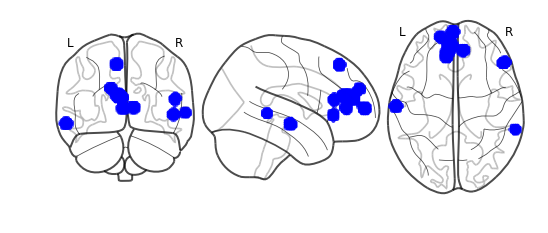

../../data/niis/pcas/rest_1_pca_chunk_1
Condition = rest; Chunk = 1; PCA = 1; Variance explained = 0.05


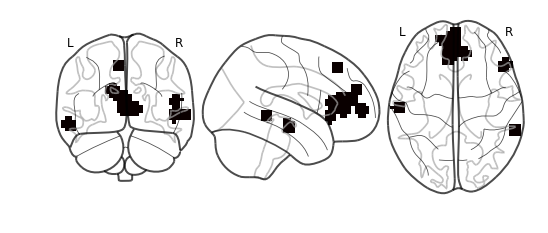

[[ 0.05084917  0.02613447  0.01294937 ...  0.05064822  0.00556602
  -0.00447757]
 [-0.00186993 -0.01195567  0.04337996 ...  0.03401246  0.05547837
   0.01964413]
 [-0.02725789 -0.00344781  0.05171722 ... -0.05968691 -0.06871901
  -0.05862013]
 ...
 [ 0.01435114  0.00317663  0.01405927 ... -0.00795828 -0.0001661
  -0.05414934]
 [-0.01535778  0.00868106 -0.03457536 ...  0.03521439  0.0215056
  -0.02115671]
 [ 0.01051727 -0.00801434  0.01994502 ... -0.03720284  0.03357394
   0.00296504]]


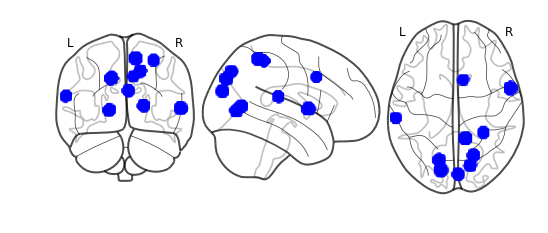

../../data/niis/pcas/rest_2_pca_chunk_1
Condition = rest; Chunk = 1; PCA = 2; Variance explained = 0.04


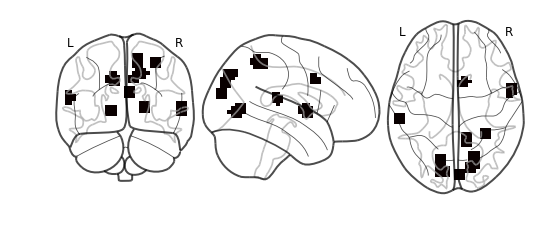

[[ 0.05084917  0.02613447  0.01294937 ...  0.05064822  0.00556602
  -0.00447757]
 [-0.00186993 -0.01195567  0.04337996 ...  0.03401246  0.05547837
   0.01964413]
 [-0.02725789 -0.00344781  0.05171722 ... -0.05968691 -0.06871901
  -0.05862013]
 ...
 [ 0.01435114  0.00317663  0.01405927 ... -0.00795828 -0.0001661
  -0.05414934]
 [-0.01535778  0.00868106 -0.03457536 ...  0.03521439  0.0215056
  -0.02115671]
 [ 0.01051727 -0.00801434  0.01994502 ... -0.03720284  0.03357394
   0.00296504]]


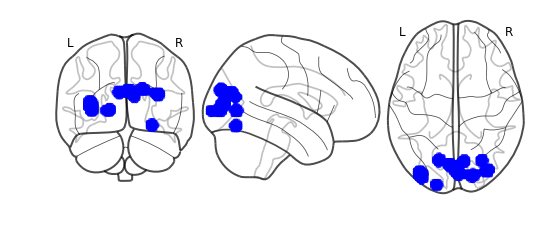

../../data/niis/pcas/rest_3_pca_chunk_1
Condition = rest; Chunk = 1; PCA = 3; Variance explained = 0.03


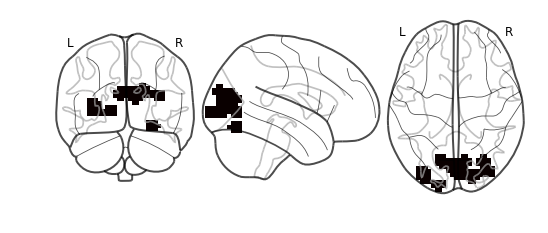

[[ 0.05084917  0.02613447  0.01294937 ...  0.05064822  0.00556602
  -0.00447757]
 [-0.00186993 -0.01195567  0.04337996 ...  0.03401246  0.05547837
   0.01964413]
 [-0.02725789 -0.00344781  0.05171722 ... -0.05968691 -0.06871901
  -0.05862013]
 ...
 [ 0.01435114  0.00317663  0.01405927 ... -0.00795828 -0.0001661
  -0.05414934]
 [-0.01535778  0.00868106 -0.03457536 ...  0.03521439  0.0215056
  -0.02115671]
 [ 0.01051727 -0.00801434  0.01994502 ... -0.03720284  0.03357394
   0.00296504]]


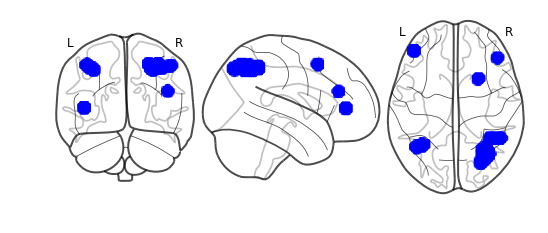

../../data/niis/pcas/rest_4_pca_chunk_1
Condition = rest; Chunk = 1; PCA = 4; Variance explained = 0.02


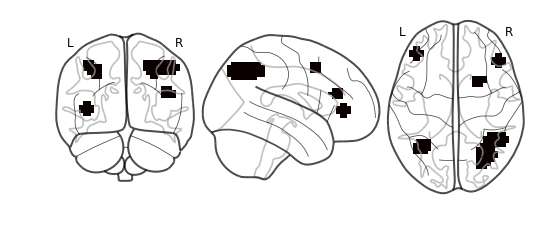

[[ 0.05084917  0.02613447  0.01294937 ...  0.05064822  0.00556602
  -0.00447757]
 [-0.00186993 -0.01195567  0.04337996 ...  0.03401246  0.05547837
   0.01964413]
 [-0.02725789 -0.00344781  0.05171722 ... -0.05968691 -0.06871901
  -0.05862013]
 ...
 [ 0.01435114  0.00317663  0.01405927 ... -0.00795828 -0.0001661
  -0.05414934]
 [-0.01535778  0.00868106 -0.03457536 ...  0.03521439  0.0215056
  -0.02115671]
 [ 0.01051727 -0.00801434  0.01994502 ... -0.03720284  0.03357394
   0.00296504]]


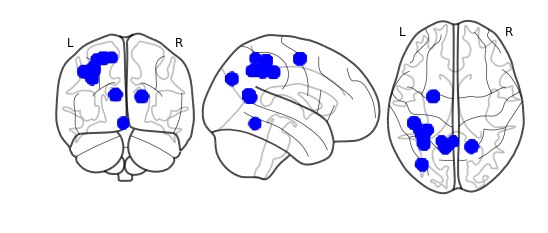

../../data/niis/pcas/rest_5_pca_chunk_1
Condition = rest; Chunk = 1; PCA = 5; Variance explained = 0.02


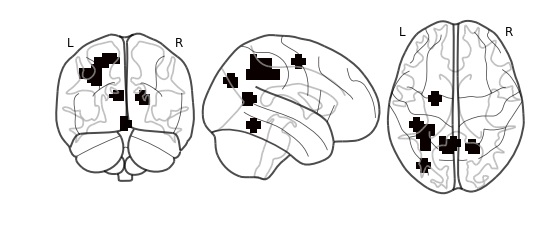

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.04760832  0.0185162   0.03567398 ...  0.04074181  0.0294339
   0.02177726]
 [ 0.0126338   0.03597252 -0.04123966 ... -0.01044939 -0.03334075
  -0.01990888]
 [-0.05234049 -0.04309197 -0.04109477 ... -0.00556023 -0.00568261
  -0.01444239]
 ...
 [ 0.01690873 -0.00165096 -0.03826417 ...  0.06024253  0.04633644
  -0.00465789]
 [ 0.0101452  -0.00150514 -0.01959839 ...  0.03985222  0.01993508
  -0.01479817]
 [-0.00158828 -0.02613871 -0.0040461  ...  0.01078496 -0.02622204
   0.02402976]]


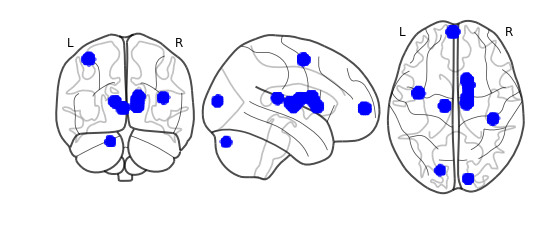

../../data/niis/pcas/intact_1_pca_chunk_2
Condition = intact; Chunk = 2; PCA = 1; Variance explained = 0.16


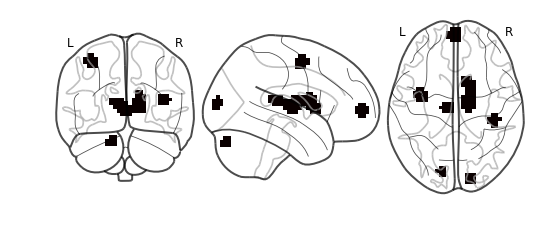

[[ 0.04760832  0.0185162   0.03567398 ...  0.04074181  0.0294339
   0.02177726]
 [ 0.0126338   0.03597252 -0.04123966 ... -0.01044939 -0.03334075
  -0.01990888]
 [-0.05234049 -0.04309197 -0.04109477 ... -0.00556023 -0.00568261
  -0.01444239]
 ...
 [ 0.01690873 -0.00165096 -0.03826417 ...  0.06024253  0.04633644
  -0.00465789]
 [ 0.0101452  -0.00150514 -0.01959839 ...  0.03985222  0.01993508
  -0.01479817]
 [-0.00158828 -0.02613871 -0.0040461  ...  0.01078496 -0.02622204
   0.02402976]]


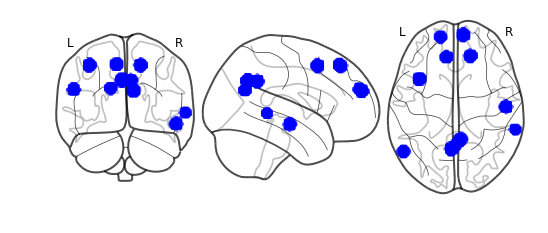

../../data/niis/pcas/intact_2_pca_chunk_2
Condition = intact; Chunk = 2; PCA = 2; Variance explained = 0.04


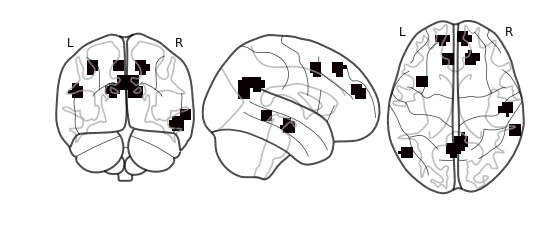

[[ 0.04760832  0.0185162   0.03567398 ...  0.04074181  0.0294339
   0.02177726]
 [ 0.0126338   0.03597252 -0.04123966 ... -0.01044939 -0.03334075
  -0.01990888]
 [-0.05234049 -0.04309197 -0.04109477 ... -0.00556023 -0.00568261
  -0.01444239]
 ...
 [ 0.01690873 -0.00165096 -0.03826417 ...  0.06024253  0.04633644
  -0.00465789]
 [ 0.0101452  -0.00150514 -0.01959839 ...  0.03985222  0.01993508
  -0.01479817]
 [-0.00158828 -0.02613871 -0.0040461  ...  0.01078496 -0.02622204
   0.02402976]]


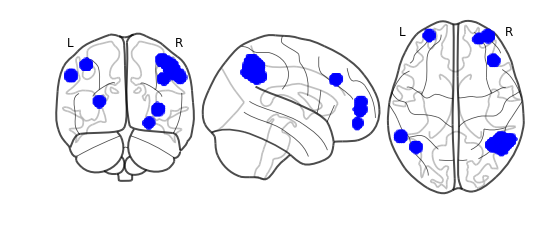

../../data/niis/pcas/intact_3_pca_chunk_2
Condition = intact; Chunk = 2; PCA = 3; Variance explained = 0.02


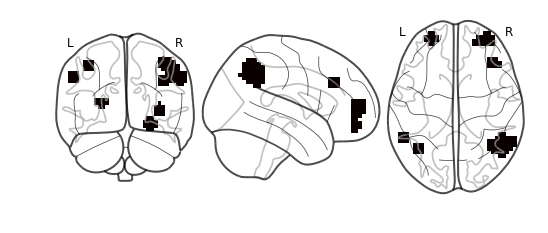

[[ 0.04760832  0.0185162   0.03567398 ...  0.04074181  0.0294339
   0.02177726]
 [ 0.0126338   0.03597252 -0.04123966 ... -0.01044939 -0.03334075
  -0.01990888]
 [-0.05234049 -0.04309197 -0.04109477 ... -0.00556023 -0.00568261
  -0.01444239]
 ...
 [ 0.01690873 -0.00165096 -0.03826417 ...  0.06024253  0.04633644
  -0.00465789]
 [ 0.0101452  -0.00150514 -0.01959839 ...  0.03985222  0.01993508
  -0.01479817]
 [-0.00158828 -0.02613871 -0.0040461  ...  0.01078496 -0.02622204
   0.02402976]]


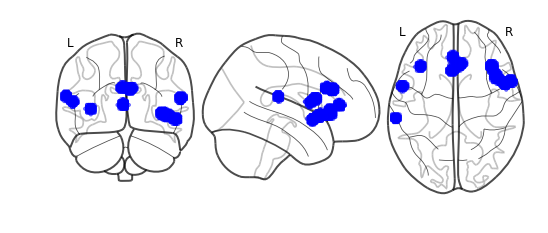

../../data/niis/pcas/intact_4_pca_chunk_2
Condition = intact; Chunk = 2; PCA = 4; Variance explained = 0.02


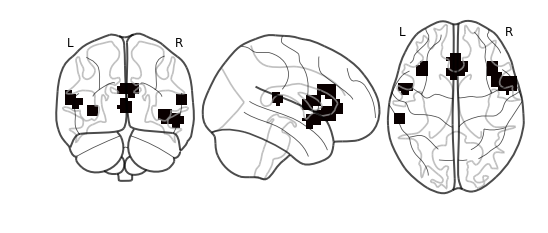

[[ 0.04760832  0.0185162   0.03567398 ...  0.04074181  0.0294339
   0.02177726]
 [ 0.0126338   0.03597252 -0.04123966 ... -0.01044939 -0.03334075
  -0.01990888]
 [-0.05234049 -0.04309197 -0.04109477 ... -0.00556023 -0.00568261
  -0.01444239]
 ...
 [ 0.01690873 -0.00165096 -0.03826417 ...  0.06024253  0.04633644
  -0.00465789]
 [ 0.0101452  -0.00150514 -0.01959839 ...  0.03985222  0.01993508
  -0.01479817]
 [-0.00158828 -0.02613871 -0.0040461  ...  0.01078496 -0.02622204
   0.02402976]]


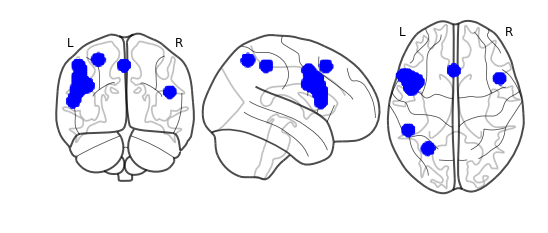

../../data/niis/pcas/intact_5_pca_chunk_2
Condition = intact; Chunk = 2; PCA = 5; Variance explained = 0.01


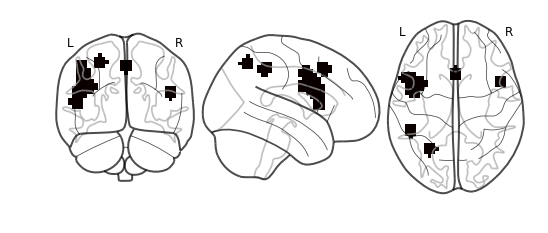

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.03674877  0.02553548  0.03595413 ...  0.02289099  0.02063907
   0.02820808]
 [ 0.00457406 -0.02991379  0.01445585 ... -0.02653117  0.04874646
   0.01058469]
 [ 0.01543686 -0.03912683 -0.02897118 ...  0.01759679  0.01232999
   0.01859778]
 ...
 [-0.03164905  0.04794193 -0.00527283 ...  0.03198001  0.01752604
  -0.00361377]
 [-0.01831354 -0.03001973 -0.02762234 ... -0.03371866  0.03305205
   0.02312381]
 [ 0.00229196  0.02962294 -0.05246487 ...  0.01536058 -0.02047487
  -0.00876712]]


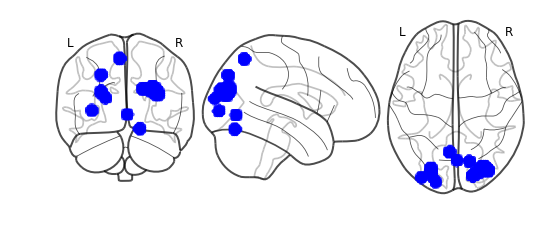

../../data/niis/pcas/paragraph_1_pca_chunk_2
Condition = paragraph; Chunk = 2; PCA = 1; Variance explained = 0.11


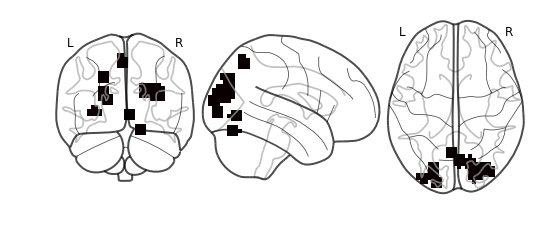

[[ 0.03674877  0.02553548  0.03595413 ...  0.02289099  0.02063907
   0.02820808]
 [ 0.00457406 -0.02991379  0.01445585 ... -0.02653117  0.04874646
   0.01058469]
 [ 0.01543686 -0.03912683 -0.02897118 ...  0.01759679  0.01232999
   0.01859778]
 ...
 [-0.03164905  0.04794193 -0.00527283 ...  0.03198001  0.01752604
  -0.00361377]
 [-0.01831354 -0.03001973 -0.02762234 ... -0.03371866  0.03305205
   0.02312381]
 [ 0.00229196  0.02962294 -0.05246487 ...  0.01536058 -0.02047487
  -0.00876712]]


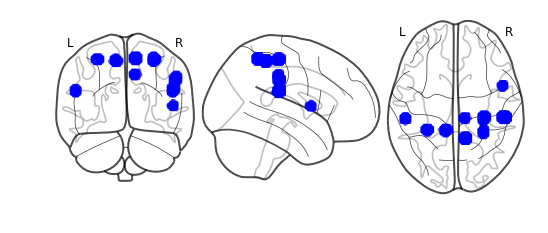

../../data/niis/pcas/paragraph_2_pca_chunk_2
Condition = paragraph; Chunk = 2; PCA = 2; Variance explained = 0.04


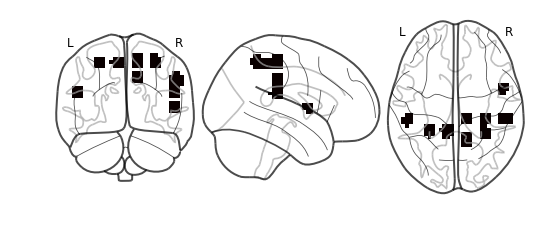

[[ 0.03674877  0.02553548  0.03595413 ...  0.02289099  0.02063907
   0.02820808]
 [ 0.00457406 -0.02991379  0.01445585 ... -0.02653117  0.04874646
   0.01058469]
 [ 0.01543686 -0.03912683 -0.02897118 ...  0.01759679  0.01232999
   0.01859778]
 ...
 [-0.03164905  0.04794193 -0.00527283 ...  0.03198001  0.01752604
  -0.00361377]
 [-0.01831354 -0.03001973 -0.02762234 ... -0.03371866  0.03305205
   0.02312381]
 [ 0.00229196  0.02962294 -0.05246487 ...  0.01536058 -0.02047487
  -0.00876712]]


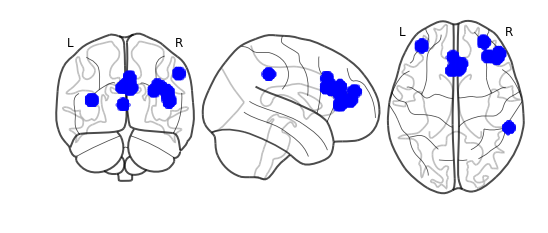

../../data/niis/pcas/paragraph_3_pca_chunk_2
Condition = paragraph; Chunk = 2; PCA = 3; Variance explained = 0.03


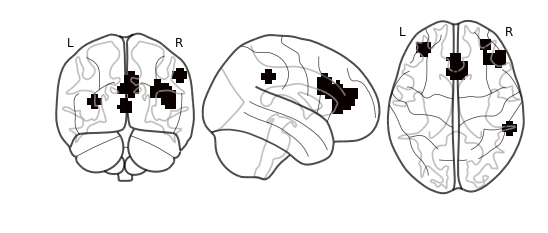

[[ 0.03674877  0.02553548  0.03595413 ...  0.02289099  0.02063907
   0.02820808]
 [ 0.00457406 -0.02991379  0.01445585 ... -0.02653117  0.04874646
   0.01058469]
 [ 0.01543686 -0.03912683 -0.02897118 ...  0.01759679  0.01232999
   0.01859778]
 ...
 [-0.03164905  0.04794193 -0.00527283 ...  0.03198001  0.01752604
  -0.00361377]
 [-0.01831354 -0.03001973 -0.02762234 ... -0.03371866  0.03305205
   0.02312381]
 [ 0.00229196  0.02962294 -0.05246487 ...  0.01536058 -0.02047487
  -0.00876712]]


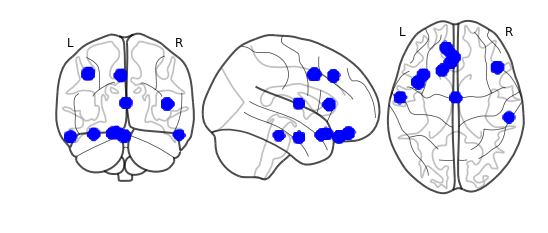

../../data/niis/pcas/paragraph_4_pca_chunk_2
Condition = paragraph; Chunk = 2; PCA = 4; Variance explained = 0.02


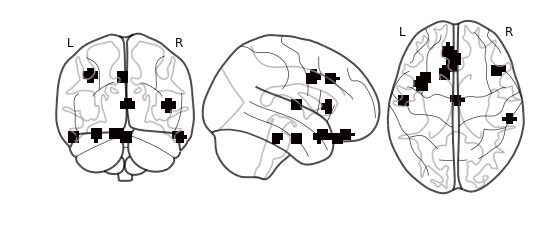

[[ 0.03674877  0.02553548  0.03595413 ...  0.02289099  0.02063907
   0.02820808]
 [ 0.00457406 -0.02991379  0.01445585 ... -0.02653117  0.04874646
   0.01058469]
 [ 0.01543686 -0.03912683 -0.02897118 ...  0.01759679  0.01232999
   0.01859778]
 ...
 [-0.03164905  0.04794193 -0.00527283 ...  0.03198001  0.01752604
  -0.00361377]
 [-0.01831354 -0.03001973 -0.02762234 ... -0.03371866  0.03305205
   0.02312381]
 [ 0.00229196  0.02962294 -0.05246487 ...  0.01536058 -0.02047487
  -0.00876712]]


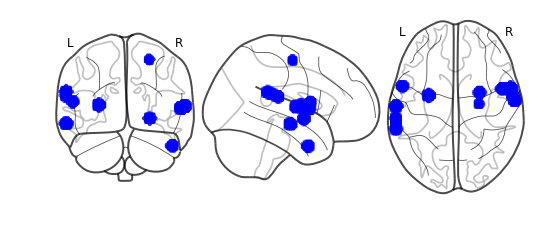

../../data/niis/pcas/paragraph_5_pca_chunk_2
Condition = paragraph; Chunk = 2; PCA = 5; Variance explained = 0.02


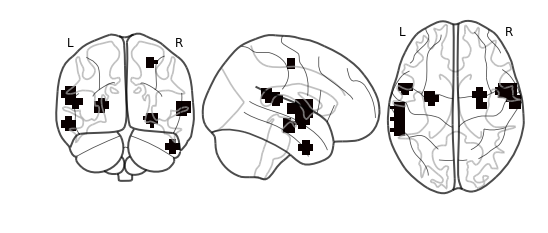

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.04179149  0.02129592  0.04161112 ...  0.03234633  0.02975809
   0.0188815 ]
 [-0.01127266  0.01234264 -0.05005998 ... -0.0237712  -0.05142919
  -0.02244673]
 [ 0.01650306  0.03069811 -0.04453823 ...  0.06903563  0.01867612
   0.0726603 ]
 ...
 [-0.01728274  0.02908145  0.02676936 ...  0.0408033   0.01741166
   0.00116009]
 [-0.03128774  0.02165679  0.02990791 ...  0.01035505  0.00179327
  -0.02303055]
 [-0.00948516 -0.01338819 -0.00040519 ... -0.03004901 -0.02528077
  -0.00533788]]


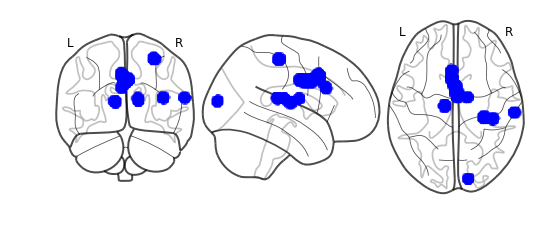

../../data/niis/pcas/word_1_pca_chunk_2
Condition = word; Chunk = 2; PCA = 1; Variance explained = 0.19


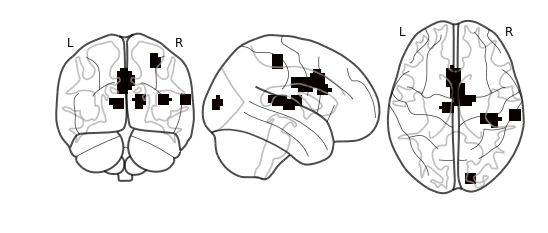

[[ 0.04179149  0.02129592  0.04161112 ...  0.03234633  0.02975809
   0.0188815 ]
 [-0.01127266  0.01234264 -0.05005998 ... -0.0237712  -0.05142919
  -0.02244673]
 [ 0.01650306  0.03069811 -0.04453823 ...  0.06903563  0.01867612
   0.0726603 ]
 ...
 [-0.01728274  0.02908145  0.02676936 ...  0.0408033   0.01741166
   0.00116009]
 [-0.03128774  0.02165679  0.02990791 ...  0.01035505  0.00179327
  -0.02303055]
 [-0.00948516 -0.01338819 -0.00040519 ... -0.03004901 -0.02528077
  -0.00533788]]


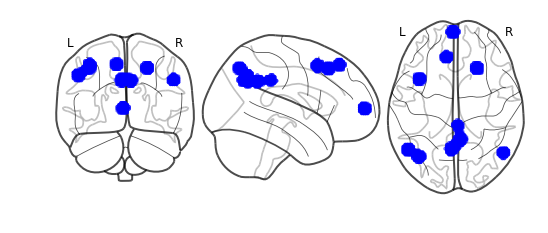

../../data/niis/pcas/word_2_pca_chunk_2
Condition = word; Chunk = 2; PCA = 2; Variance explained = 0.03


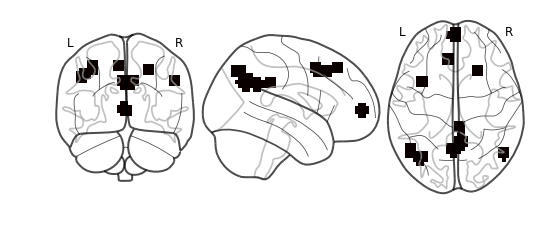

[[ 0.04179149  0.02129592  0.04161112 ...  0.03234633  0.02975809
   0.0188815 ]
 [-0.01127266  0.01234264 -0.05005998 ... -0.0237712  -0.05142919
  -0.02244673]
 [ 0.01650306  0.03069811 -0.04453823 ...  0.06903563  0.01867612
   0.0726603 ]
 ...
 [-0.01728274  0.02908145  0.02676936 ...  0.0408033   0.01741166
   0.00116009]
 [-0.03128774  0.02165679  0.02990791 ...  0.01035505  0.00179327
  -0.02303055]
 [-0.00948516 -0.01338819 -0.00040519 ... -0.03004901 -0.02528077
  -0.00533788]]


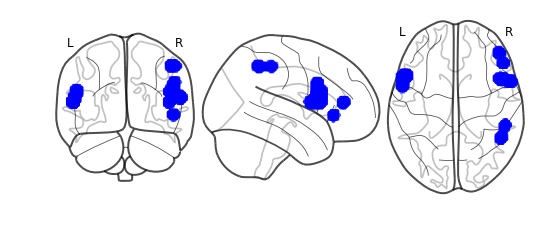

../../data/niis/pcas/word_3_pca_chunk_2
Condition = word; Chunk = 2; PCA = 3; Variance explained = 0.02


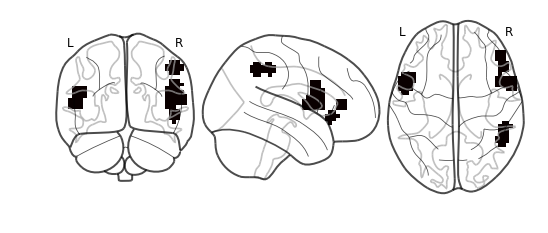

[[ 0.04179149  0.02129592  0.04161112 ...  0.03234633  0.02975809
   0.0188815 ]
 [-0.01127266  0.01234264 -0.05005998 ... -0.0237712  -0.05142919
  -0.02244673]
 [ 0.01650306  0.03069811 -0.04453823 ...  0.06903563  0.01867612
   0.0726603 ]
 ...
 [-0.01728274  0.02908145  0.02676936 ...  0.0408033   0.01741166
   0.00116009]
 [-0.03128774  0.02165679  0.02990791 ...  0.01035505  0.00179327
  -0.02303055]
 [-0.00948516 -0.01338819 -0.00040519 ... -0.03004901 -0.02528077
  -0.00533788]]


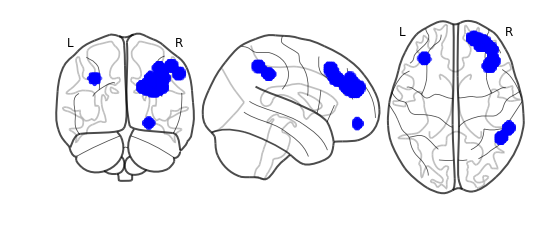

../../data/niis/pcas/word_4_pca_chunk_2
Condition = word; Chunk = 2; PCA = 4; Variance explained = 0.02


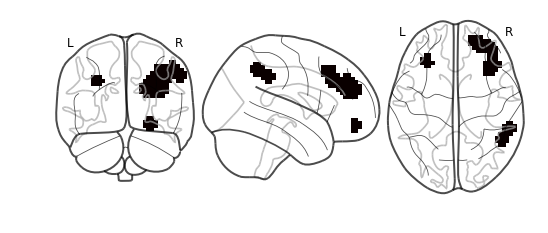

[[ 0.04179149  0.02129592  0.04161112 ...  0.03234633  0.02975809
   0.0188815 ]
 [-0.01127266  0.01234264 -0.05005998 ... -0.0237712  -0.05142919
  -0.02244673]
 [ 0.01650306  0.03069811 -0.04453823 ...  0.06903563  0.01867612
   0.0726603 ]
 ...
 [-0.01728274  0.02908145  0.02676936 ...  0.0408033   0.01741166
   0.00116009]
 [-0.03128774  0.02165679  0.02990791 ...  0.01035505  0.00179327
  -0.02303055]
 [-0.00948516 -0.01338819 -0.00040519 ... -0.03004901 -0.02528077
  -0.00533788]]


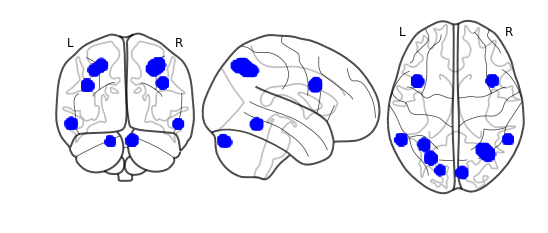

../../data/niis/pcas/word_5_pca_chunk_2
Condition = word; Chunk = 2; PCA = 5; Variance explained = 0.02


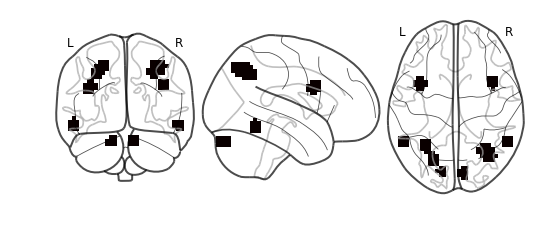

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.0436834   0.01411651  0.03906422 ...  0.07024313  0.00934572
   0.01079504]
 [ 0.00592672  0.01651248 -0.0356283  ... -0.02060346 -0.04357187
  -0.03180171]
 [ 0.01309128 -0.00384708 -0.04544051 ...  0.04902429  0.04235721
   0.08932816]
 ...
 [ 0.02293861 -0.00276952  0.04436686 ...  0.03946001  0.0189522
   0.01314905]
 [-0.00222264 -0.00276073  0.02814086 ...  0.05407412  0.05564695
  -0.03556155]
 [ 0.01957836 -0.01899988 -0.03142564 ...  0.04118    -0.03694271
   0.01882998]]


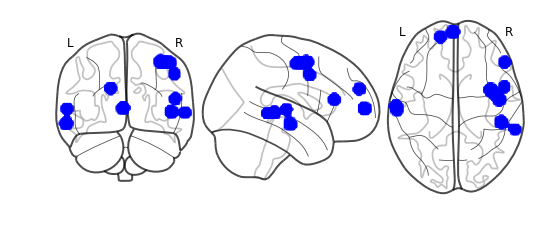

../../data/niis/pcas/rest_1_pca_chunk_2
Condition = rest; Chunk = 2; PCA = 1; Variance explained = 0.05


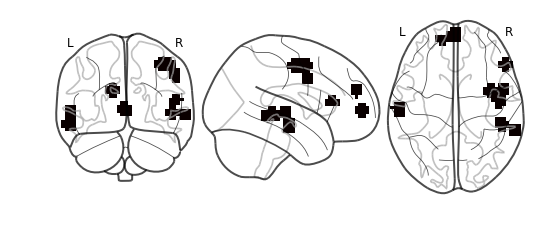

[[ 0.0436834   0.01411651  0.03906422 ...  0.07024313  0.00934572
   0.01079504]
 [ 0.00592672  0.01651248 -0.0356283  ... -0.02060346 -0.04357187
  -0.03180171]
 [ 0.01309128 -0.00384708 -0.04544051 ...  0.04902429  0.04235721
   0.08932816]
 ...
 [ 0.02293861 -0.00276952  0.04436686 ...  0.03946001  0.0189522
   0.01314905]
 [-0.00222264 -0.00276073  0.02814086 ...  0.05407412  0.05564695
  -0.03556155]
 [ 0.01957836 -0.01899988 -0.03142564 ...  0.04118    -0.03694271
   0.01882998]]


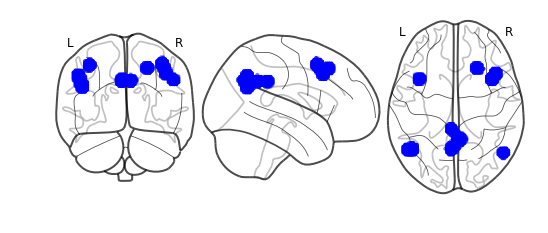

../../data/niis/pcas/rest_2_pca_chunk_2
Condition = rest; Chunk = 2; PCA = 2; Variance explained = 0.04


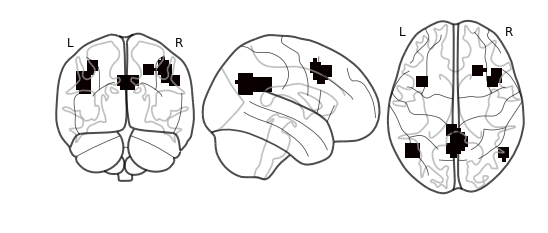

[[ 0.0436834   0.01411651  0.03906422 ...  0.07024313  0.00934572
   0.01079504]
 [ 0.00592672  0.01651248 -0.0356283  ... -0.02060346 -0.04357187
  -0.03180171]
 [ 0.01309128 -0.00384708 -0.04544051 ...  0.04902429  0.04235721
   0.08932816]
 ...
 [ 0.02293861 -0.00276952  0.04436686 ...  0.03946001  0.0189522
   0.01314905]
 [-0.00222264 -0.00276073  0.02814086 ...  0.05407412  0.05564695
  -0.03556155]
 [ 0.01957836 -0.01899988 -0.03142564 ...  0.04118    -0.03694271
   0.01882998]]


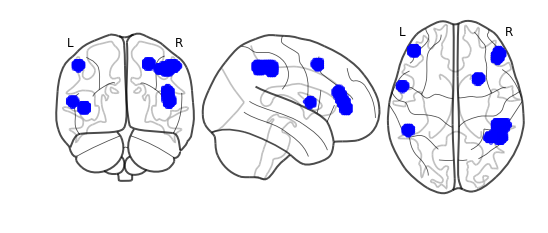

../../data/niis/pcas/rest_3_pca_chunk_2
Condition = rest; Chunk = 2; PCA = 3; Variance explained = 0.02


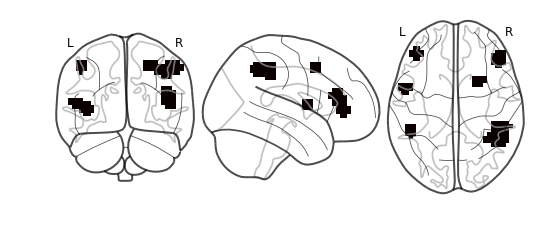

[[ 0.0436834   0.01411651  0.03906422 ...  0.07024313  0.00934572
   0.01079504]
 [ 0.00592672  0.01651248 -0.0356283  ... -0.02060346 -0.04357187
  -0.03180171]
 [ 0.01309128 -0.00384708 -0.04544051 ...  0.04902429  0.04235721
   0.08932816]
 ...
 [ 0.02293861 -0.00276952  0.04436686 ...  0.03946001  0.0189522
   0.01314905]
 [-0.00222264 -0.00276073  0.02814086 ...  0.05407412  0.05564695
  -0.03556155]
 [ 0.01957836 -0.01899988 -0.03142564 ...  0.04118    -0.03694271
   0.01882998]]


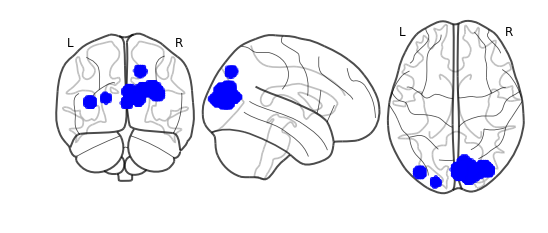

../../data/niis/pcas/rest_4_pca_chunk_2
Condition = rest; Chunk = 2; PCA = 4; Variance explained = 0.02


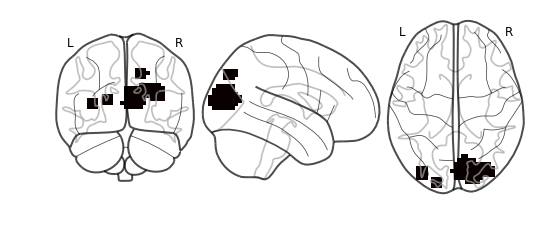

[[ 0.0436834   0.01411651  0.03906422 ...  0.07024313  0.00934572
   0.01079504]
 [ 0.00592672  0.01651248 -0.0356283  ... -0.02060346 -0.04357187
  -0.03180171]
 [ 0.01309128 -0.00384708 -0.04544051 ...  0.04902429  0.04235721
   0.08932816]
 ...
 [ 0.02293861 -0.00276952  0.04436686 ...  0.03946001  0.0189522
   0.01314905]
 [-0.00222264 -0.00276073  0.02814086 ...  0.05407412  0.05564695
  -0.03556155]
 [ 0.01957836 -0.01899988 -0.03142564 ...  0.04118    -0.03694271
   0.01882998]]


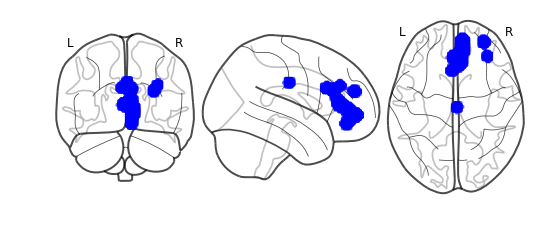

../../data/niis/pcas/rest_5_pca_chunk_2
Condition = rest; Chunk = 2; PCA = 5; Variance explained = 0.02


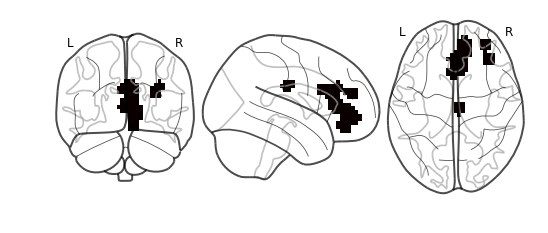

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.04867535  0.0098251   0.04023187 ...  0.03799668  0.02651636
   0.02501715]
 [ 0.02408469  0.03855414 -0.0340623  ...  0.00534135 -0.01236124
   0.00633732]
 [ 0.04937495  0.0097461   0.00936951 ...  0.0240515   0.05150167
   0.02722793]
 ...
 [-0.00598718  0.04020894 -0.01672296 ...  0.01850478  0.01777178
   0.01786869]
 [-0.00156592 -0.03527362  0.01527005 ...  0.00929389  0.02193089
   0.0224206 ]
 [ 0.00696908  0.01785974  0.00911892 ...  0.00703941 -0.01078972
   0.00453016]]


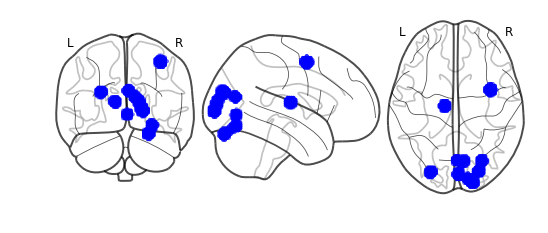

../../data/niis/pcas/intact_1_pca_chunk_3
Condition = intact; Chunk = 3; PCA = 1; Variance explained = 0.14


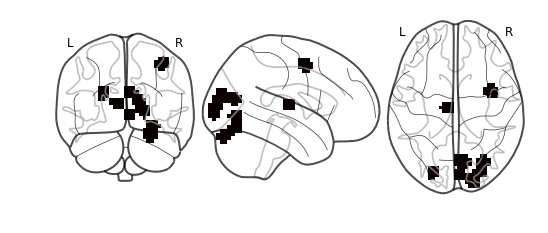

[[ 0.04867535  0.0098251   0.04023187 ...  0.03799668  0.02651636
   0.02501715]
 [ 0.02408469  0.03855414 -0.0340623  ...  0.00534135 -0.01236124
   0.00633732]
 [ 0.04937495  0.0097461   0.00936951 ...  0.0240515   0.05150167
   0.02722793]
 ...
 [-0.00598718  0.04020894 -0.01672296 ...  0.01850478  0.01777178
   0.01786869]
 [-0.00156592 -0.03527362  0.01527005 ...  0.00929389  0.02193089
   0.0224206 ]
 [ 0.00696908  0.01785974  0.00911892 ...  0.00703941 -0.01078972
   0.00453016]]


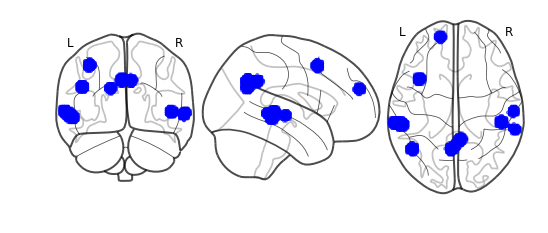

../../data/niis/pcas/intact_2_pca_chunk_3
Condition = intact; Chunk = 3; PCA = 2; Variance explained = 0.04


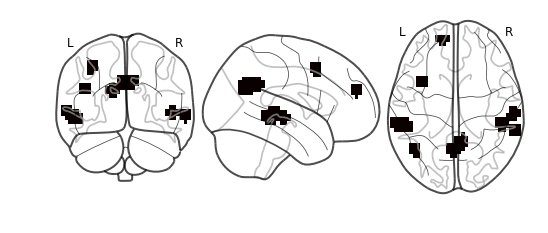

[[ 0.04867535  0.0098251   0.04023187 ...  0.03799668  0.02651636
   0.02501715]
 [ 0.02408469  0.03855414 -0.0340623  ...  0.00534135 -0.01236124
   0.00633732]
 [ 0.04937495  0.0097461   0.00936951 ...  0.0240515   0.05150167
   0.02722793]
 ...
 [-0.00598718  0.04020894 -0.01672296 ...  0.01850478  0.01777178
   0.01786869]
 [-0.00156592 -0.03527362  0.01527005 ...  0.00929389  0.02193089
   0.0224206 ]
 [ 0.00696908  0.01785974  0.00911892 ...  0.00703941 -0.01078972
   0.00453016]]


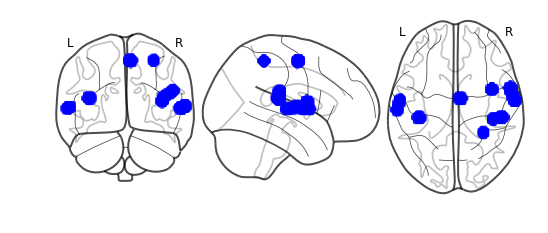

../../data/niis/pcas/intact_3_pca_chunk_3
Condition = intact; Chunk = 3; PCA = 3; Variance explained = 0.03


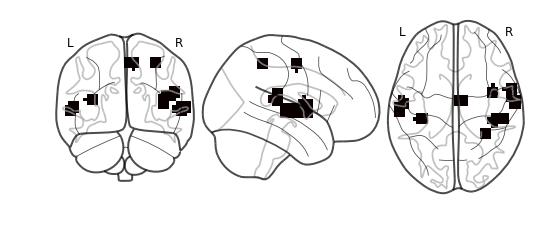

[[ 0.04867535  0.0098251   0.04023187 ...  0.03799668  0.02651636
   0.02501715]
 [ 0.02408469  0.03855414 -0.0340623  ...  0.00534135 -0.01236124
   0.00633732]
 [ 0.04937495  0.0097461   0.00936951 ...  0.0240515   0.05150167
   0.02722793]
 ...
 [-0.00598718  0.04020894 -0.01672296 ...  0.01850478  0.01777178
   0.01786869]
 [-0.00156592 -0.03527362  0.01527005 ...  0.00929389  0.02193089
   0.0224206 ]
 [ 0.00696908  0.01785974  0.00911892 ...  0.00703941 -0.01078972
   0.00453016]]


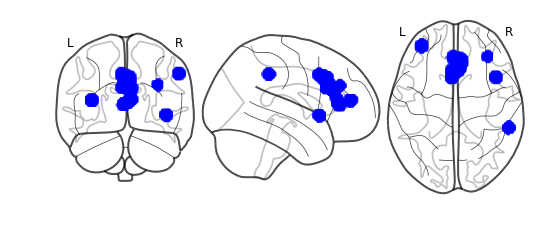

../../data/niis/pcas/intact_4_pca_chunk_3
Condition = intact; Chunk = 3; PCA = 4; Variance explained = 0.03


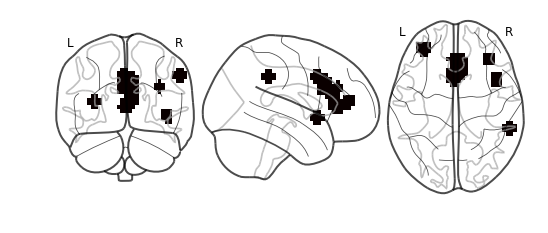

[[ 0.04867535  0.0098251   0.04023187 ...  0.03799668  0.02651636
   0.02501715]
 [ 0.02408469  0.03855414 -0.0340623  ...  0.00534135 -0.01236124
   0.00633732]
 [ 0.04937495  0.0097461   0.00936951 ...  0.0240515   0.05150167
   0.02722793]
 ...
 [-0.00598718  0.04020894 -0.01672296 ...  0.01850478  0.01777178
   0.01786869]
 [-0.00156592 -0.03527362  0.01527005 ...  0.00929389  0.02193089
   0.0224206 ]
 [ 0.00696908  0.01785974  0.00911892 ...  0.00703941 -0.01078972
   0.00453016]]


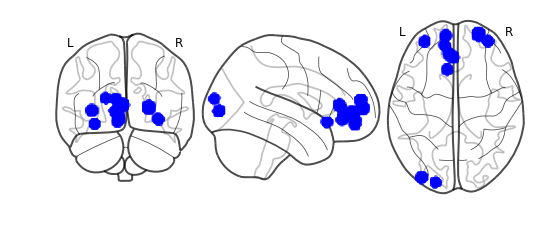

../../data/niis/pcas/intact_5_pca_chunk_3
Condition = intact; Chunk = 3; PCA = 5; Variance explained = 0.02


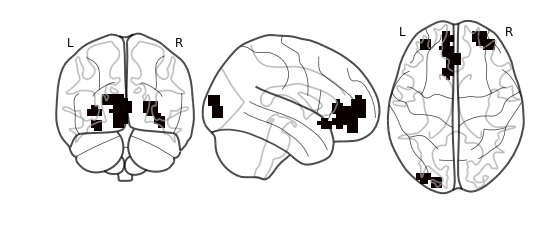

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.04274571  0.01373878  0.02794137 ...  0.02594469  0.04171768
   0.02937088]
 [-0.0044042   0.00752955 -0.06659744 ... -0.01909757 -0.07507042
   0.01451613]
 [ 0.03158024  0.03830147  0.00674612 ... -0.01085645  0.00709378
  -0.02696855]
 ...
 [-0.04095782 -0.07568088 -0.03938224 ...  0.06020542 -0.02617563
   0.02590423]
 [-0.032707    0.01603529 -0.02038247 ... -0.00319331  0.0254885
  -0.01672675]
 [-0.01957462  0.06255711  0.0455304  ... -0.02405781  0.01657389
   0.04325002]]


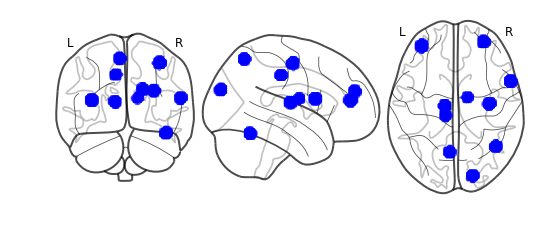

../../data/niis/pcas/paragraph_1_pca_chunk_3
Condition = paragraph; Chunk = 3; PCA = 1; Variance explained = 0.12


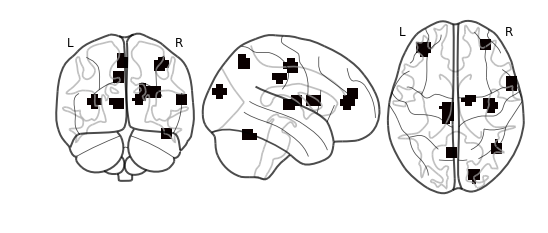

[[ 0.04274571  0.01373878  0.02794137 ...  0.02594469  0.04171768
   0.02937088]
 [-0.0044042   0.00752955 -0.06659744 ... -0.01909757 -0.07507042
   0.01451613]
 [ 0.03158024  0.03830147  0.00674612 ... -0.01085645  0.00709378
  -0.02696855]
 ...
 [-0.04095782 -0.07568088 -0.03938224 ...  0.06020542 -0.02617563
   0.02590423]
 [-0.032707    0.01603529 -0.02038247 ... -0.00319331  0.0254885
  -0.01672675]
 [-0.01957462  0.06255711  0.0455304  ... -0.02405781  0.01657389
   0.04325002]]


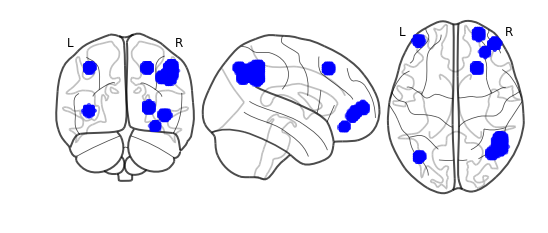

../../data/niis/pcas/paragraph_2_pca_chunk_3
Condition = paragraph; Chunk = 3; PCA = 2; Variance explained = 0.03


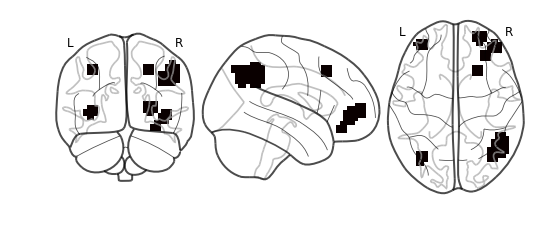

[[ 0.04274571  0.01373878  0.02794137 ...  0.02594469  0.04171768
   0.02937088]
 [-0.0044042   0.00752955 -0.06659744 ... -0.01909757 -0.07507042
   0.01451613]
 [ 0.03158024  0.03830147  0.00674612 ... -0.01085645  0.00709378
  -0.02696855]
 ...
 [-0.04095782 -0.07568088 -0.03938224 ...  0.06020542 -0.02617563
   0.02590423]
 [-0.032707    0.01603529 -0.02038247 ... -0.00319331  0.0254885
  -0.01672675]
 [-0.01957462  0.06255711  0.0455304  ... -0.02405781  0.01657389
   0.04325002]]


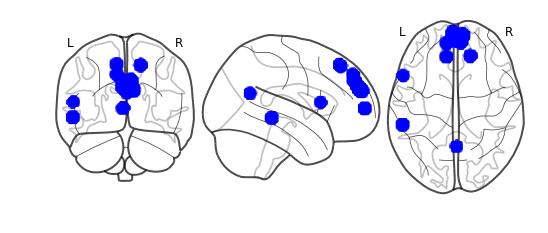

../../data/niis/pcas/paragraph_3_pca_chunk_3
Condition = paragraph; Chunk = 3; PCA = 3; Variance explained = 0.03


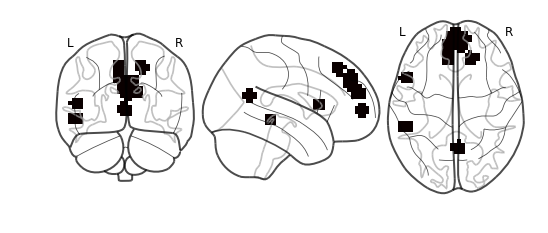

[[ 0.04274571  0.01373878  0.02794137 ...  0.02594469  0.04171768
   0.02937088]
 [-0.0044042   0.00752955 -0.06659744 ... -0.01909757 -0.07507042
   0.01451613]
 [ 0.03158024  0.03830147  0.00674612 ... -0.01085645  0.00709378
  -0.02696855]
 ...
 [-0.04095782 -0.07568088 -0.03938224 ...  0.06020542 -0.02617563
   0.02590423]
 [-0.032707    0.01603529 -0.02038247 ... -0.00319331  0.0254885
  -0.01672675]
 [-0.01957462  0.06255711  0.0455304  ... -0.02405781  0.01657389
   0.04325002]]


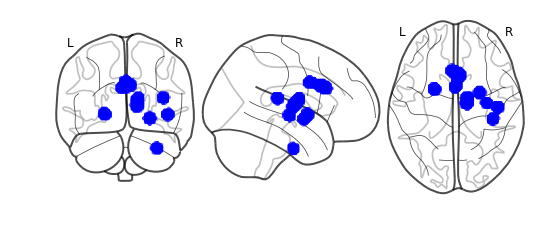

../../data/niis/pcas/paragraph_4_pca_chunk_3
Condition = paragraph; Chunk = 3; PCA = 4; Variance explained = 0.02


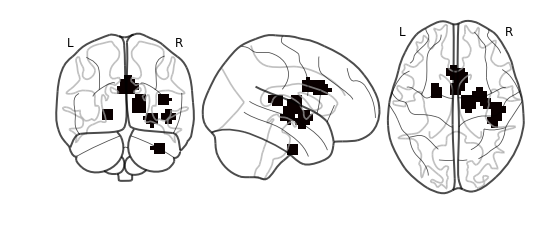

[[ 0.04274571  0.01373878  0.02794137 ...  0.02594469  0.04171768
   0.02937088]
 [-0.0044042   0.00752955 -0.06659744 ... -0.01909757 -0.07507042
   0.01451613]
 [ 0.03158024  0.03830147  0.00674612 ... -0.01085645  0.00709378
  -0.02696855]
 ...
 [-0.04095782 -0.07568088 -0.03938224 ...  0.06020542 -0.02617563
   0.02590423]
 [-0.032707    0.01603529 -0.02038247 ... -0.00319331  0.0254885
  -0.01672675]
 [-0.01957462  0.06255711  0.0455304  ... -0.02405781  0.01657389
   0.04325002]]


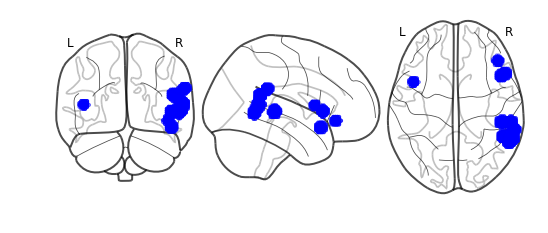

../../data/niis/pcas/paragraph_5_pca_chunk_3
Condition = paragraph; Chunk = 3; PCA = 5; Variance explained = 0.02


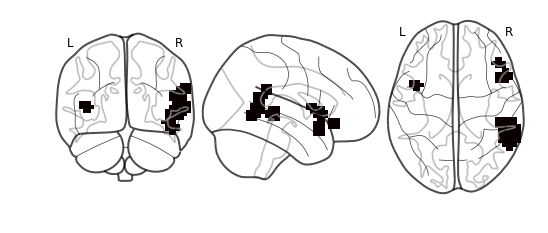

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.05194595  0.02464224  0.03764972 ...  0.03605214  0.0204106
   0.02921365]
 [-0.00258735 -0.02589394  0.04348756 ...  0.02221435  0.02074725
  -0.00935132]
 [ 0.03596854  0.03095823 -0.01946461 ...  0.0374347   0.04575163
   0.05877549]
 ...
 [ 0.00364568 -0.0048018   0.01441816 ... -0.0195428  -0.00281293
   0.00487196]
 [-0.00882908  0.00164158 -0.04436054 ...  0.03951663 -0.01432352
   0.01375716]
 [-0.00875696  0.02268161 -0.03261106 ...  0.02091621 -0.0017058
   0.01662837]]


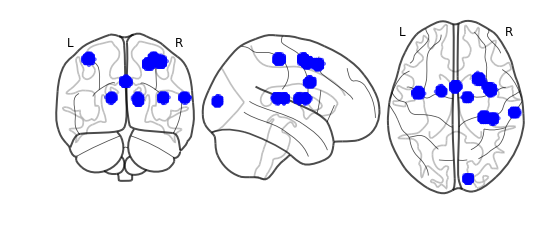

../../data/niis/pcas/word_1_pca_chunk_3
Condition = word; Chunk = 3; PCA = 1; Variance explained = 0.22


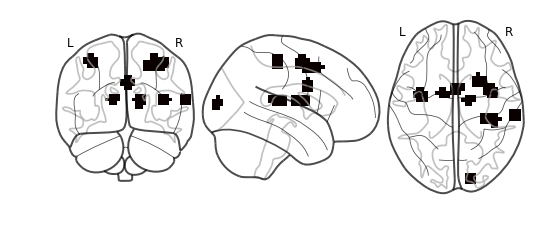

[[ 0.05194595  0.02464224  0.03764972 ...  0.03605214  0.0204106
   0.02921365]
 [-0.00258735 -0.02589394  0.04348756 ...  0.02221435  0.02074725
  -0.00935132]
 [ 0.03596854  0.03095823 -0.01946461 ...  0.0374347   0.04575163
   0.05877549]
 ...
 [ 0.00364568 -0.0048018   0.01441816 ... -0.0195428  -0.00281293
   0.00487196]
 [-0.00882908  0.00164158 -0.04436054 ...  0.03951663 -0.01432352
   0.01375716]
 [-0.00875696  0.02268161 -0.03261106 ...  0.02091621 -0.0017058
   0.01662837]]


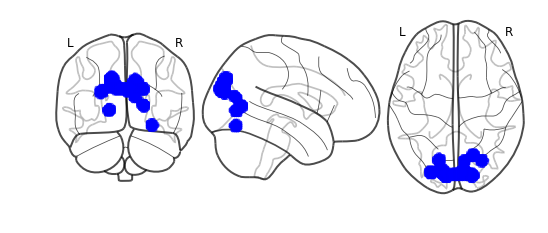

../../data/niis/pcas/word_2_pca_chunk_3
Condition = word; Chunk = 3; PCA = 2; Variance explained = 0.04


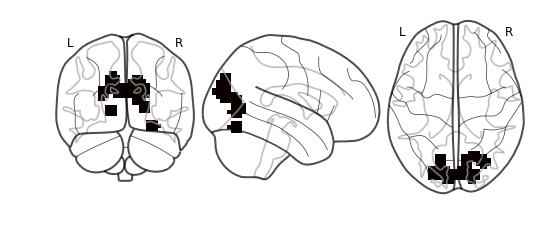

[[ 0.05194595  0.02464224  0.03764972 ...  0.03605214  0.0204106
   0.02921365]
 [-0.00258735 -0.02589394  0.04348756 ...  0.02221435  0.02074725
  -0.00935132]
 [ 0.03596854  0.03095823 -0.01946461 ...  0.0374347   0.04575163
   0.05877549]
 ...
 [ 0.00364568 -0.0048018   0.01441816 ... -0.0195428  -0.00281293
   0.00487196]
 [-0.00882908  0.00164158 -0.04436054 ...  0.03951663 -0.01432352
   0.01375716]
 [-0.00875696  0.02268161 -0.03261106 ...  0.02091621 -0.0017058
   0.01662837]]


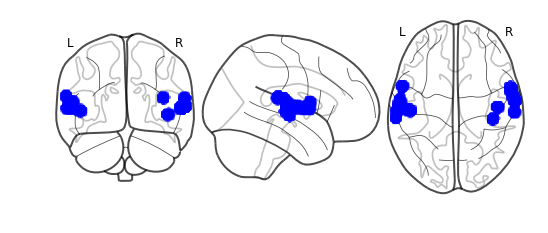

../../data/niis/pcas/word_3_pca_chunk_3
Condition = word; Chunk = 3; PCA = 3; Variance explained = 0.02


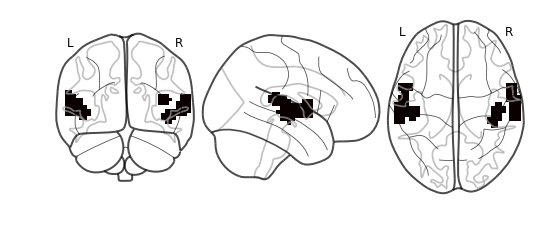

[[ 0.05194595  0.02464224  0.03764972 ...  0.03605214  0.0204106
   0.02921365]
 [-0.00258735 -0.02589394  0.04348756 ...  0.02221435  0.02074725
  -0.00935132]
 [ 0.03596854  0.03095823 -0.01946461 ...  0.0374347   0.04575163
   0.05877549]
 ...
 [ 0.00364568 -0.0048018   0.01441816 ... -0.0195428  -0.00281293
   0.00487196]
 [-0.00882908  0.00164158 -0.04436054 ...  0.03951663 -0.01432352
   0.01375716]
 [-0.00875696  0.02268161 -0.03261106 ...  0.02091621 -0.0017058
   0.01662837]]


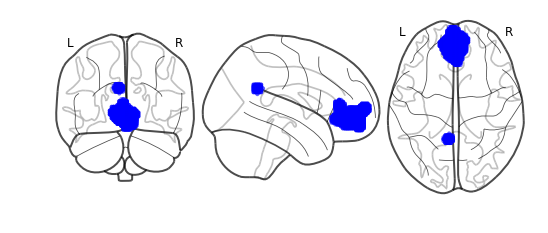

../../data/niis/pcas/word_4_pca_chunk_3
Condition = word; Chunk = 3; PCA = 4; Variance explained = 0.02


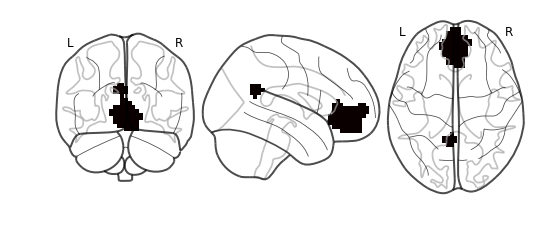

[[ 0.05194595  0.02464224  0.03764972 ...  0.03605214  0.0204106
   0.02921365]
 [-0.00258735 -0.02589394  0.04348756 ...  0.02221435  0.02074725
  -0.00935132]
 [ 0.03596854  0.03095823 -0.01946461 ...  0.0374347   0.04575163
   0.05877549]
 ...
 [ 0.00364568 -0.0048018   0.01441816 ... -0.0195428  -0.00281293
   0.00487196]
 [-0.00882908  0.00164158 -0.04436054 ...  0.03951663 -0.01432352
   0.01375716]
 [-0.00875696  0.02268161 -0.03261106 ...  0.02091621 -0.0017058
   0.01662837]]


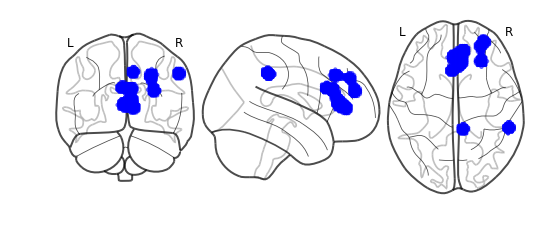

../../data/niis/pcas/word_5_pca_chunk_3
Condition = word; Chunk = 3; PCA = 5; Variance explained = 0.02


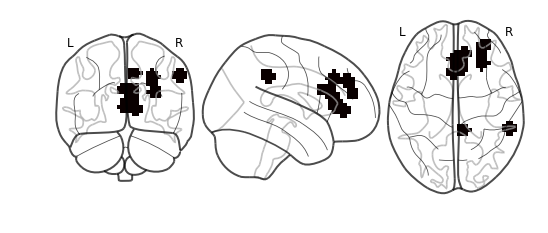

IncrementalPCA(batch_size=None, copy=True, n_components=700, whiten=False)
[[ 0.04272956  0.0305096   0.03198852 ...  0.04595965  0.00823067
  -0.0011284 ]
 [-0.01695363 -0.01522348  0.04965229 ...  0.01117102  0.0329492
   0.00711242]
 [ 0.04218307  0.00521772 -0.04149346 ...  0.04441017  0.07009516
   0.08670331]
 ...
 [ 0.00518211  0.03279974  0.02917075 ... -0.00287201 -0.04025378
  -0.04461475]
 [-0.00434354  0.03873883 -0.0086517  ... -0.07004298  0.01512836
   0.013708  ]
 [-0.01099184  0.04058985 -0.03855154 ... -0.02502257  0.02953321
  -0.00116019]]


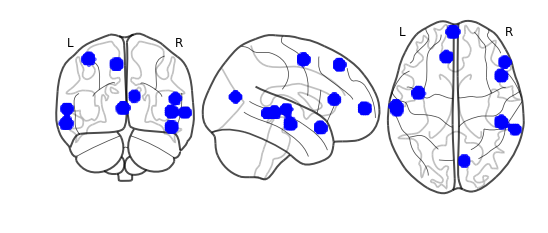

../../data/niis/pcas/rest_1_pca_chunk_3
Condition = rest; Chunk = 3; PCA = 1; Variance explained = 0.05


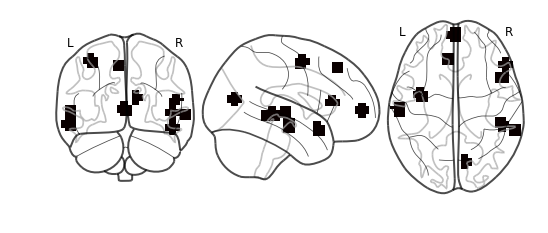

[[ 0.04272956  0.0305096   0.03198852 ...  0.04595965  0.00823067
  -0.0011284 ]
 [-0.01695363 -0.01522348  0.04965229 ...  0.01117102  0.0329492
   0.00711242]
 [ 0.04218307  0.00521772 -0.04149346 ...  0.04441017  0.07009516
   0.08670331]
 ...
 [ 0.00518211  0.03279974  0.02917075 ... -0.00287201 -0.04025378
  -0.04461475]
 [-0.00434354  0.03873883 -0.0086517  ... -0.07004298  0.01512836
   0.013708  ]
 [-0.01099184  0.04058985 -0.03855154 ... -0.02502257  0.02953321
  -0.00116019]]


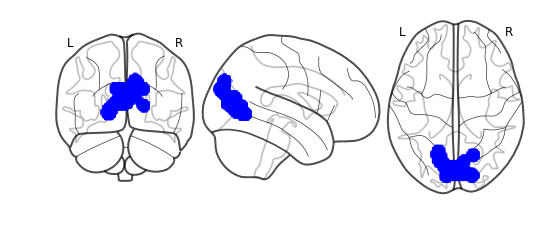

../../data/niis/pcas/rest_2_pca_chunk_3
Condition = rest; Chunk = 3; PCA = 2; Variance explained = 0.04


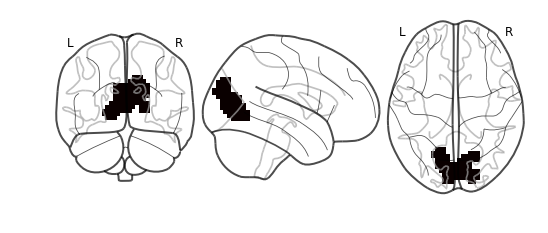

[[ 0.04272956  0.0305096   0.03198852 ...  0.04595965  0.00823067
  -0.0011284 ]
 [-0.01695363 -0.01522348  0.04965229 ...  0.01117102  0.0329492
   0.00711242]
 [ 0.04218307  0.00521772 -0.04149346 ...  0.04441017  0.07009516
   0.08670331]
 ...
 [ 0.00518211  0.03279974  0.02917075 ... -0.00287201 -0.04025378
  -0.04461475]
 [-0.00434354  0.03873883 -0.0086517  ... -0.07004298  0.01512836
   0.013708  ]
 [-0.01099184  0.04058985 -0.03855154 ... -0.02502257  0.02953321
  -0.00116019]]


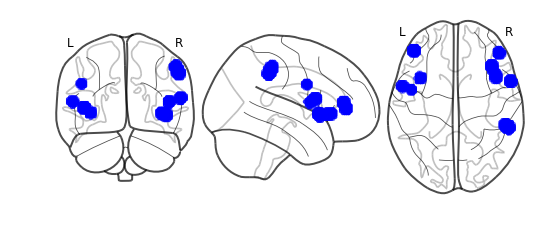

../../data/niis/pcas/rest_3_pca_chunk_3
Condition = rest; Chunk = 3; PCA = 3; Variance explained = 0.03


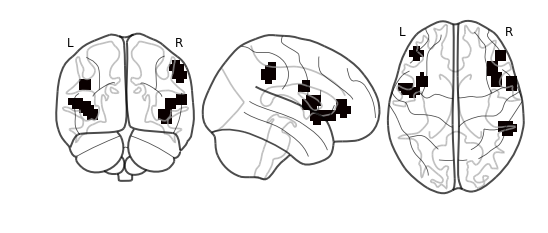

[[ 0.04272956  0.0305096   0.03198852 ...  0.04595965  0.00823067
  -0.0011284 ]
 [-0.01695363 -0.01522348  0.04965229 ...  0.01117102  0.0329492
   0.00711242]
 [ 0.04218307  0.00521772 -0.04149346 ...  0.04441017  0.07009516
   0.08670331]
 ...
 [ 0.00518211  0.03279974  0.02917075 ... -0.00287201 -0.04025378
  -0.04461475]
 [-0.00434354  0.03873883 -0.0086517  ... -0.07004298  0.01512836
   0.013708  ]
 [-0.01099184  0.04058985 -0.03855154 ... -0.02502257  0.02953321
  -0.00116019]]


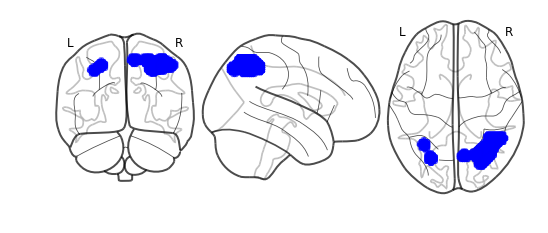

../../data/niis/pcas/rest_4_pca_chunk_3
Condition = rest; Chunk = 3; PCA = 4; Variance explained = 0.02


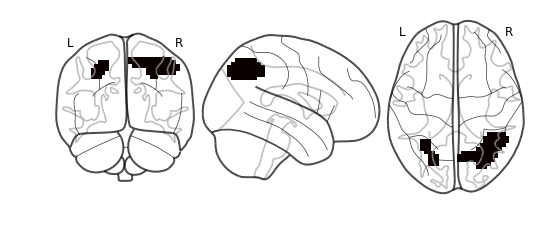

[[ 0.04272956  0.0305096   0.03198852 ...  0.04595965  0.00823067
  -0.0011284 ]
 [-0.01695363 -0.01522348  0.04965229 ...  0.01117102  0.0329492
   0.00711242]
 [ 0.04218307  0.00521772 -0.04149346 ...  0.04441017  0.07009516
   0.08670331]
 ...
 [ 0.00518211  0.03279974  0.02917075 ... -0.00287201 -0.04025378
  -0.04461475]
 [-0.00434354  0.03873883 -0.0086517  ... -0.07004298  0.01512836
   0.013708  ]
 [-0.01099184  0.04058985 -0.03855154 ... -0.02502257  0.02953321
  -0.00116019]]


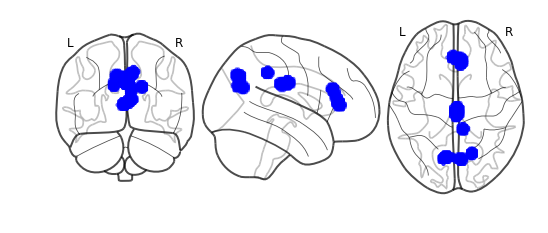

../../data/niis/pcas/rest_5_pca_chunk_3
Condition = rest; Chunk = 3; PCA = 5; Variance explained = 0.02


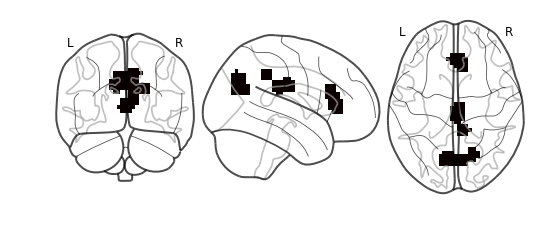

In [41]:
chunks = 3
conditions = ['intact', 'paragraph', 'word', 'rest']
#conditions = ['intact']
colors = sns.color_palette("cubehelix", 4)

for chunk in range(chunks):
    data = np.array(data_chunks[chunk])
    conds = np.array(conds_chunks[chunk])

    for e, c in enumerate(conditions):

        x = list(data[conds == c])
        
        split = np.cumsum([len(xi) for xi in x])[:-1]

        pca = IncrementalPCA(n_components=700)
        print(pca)
        x_r = np.vsplit(pca.fit_transform(np.vstack(x)), split)
        for i in np.arange(5):

            print(pca.components_)
            plt.show()
            net_inds = largest_indices(pca.components_[i], 10)
            temp_locs = centers[net_inds]
            temp_widths = widths[net_inds]
            w = rbf(temp_locs, temp_widths, template.get_locs().values)
            b_o = se.Brain(data=np.array(np.sum(w, axis=0), ndmin=2), locs=template.get_locs(), minimum_voxel_size=2)

            b_data = b_o.get_data().values.ravel()
            xyz = b_o.get_locs().values
            mask = b_data > .5
            xyz = xyz[mask]
            b_data = b_data[mask]
            b_data = np.ones(b_data.shape)+i

            b = se.Brain(data=np.atleast_2d(b_data), locs=xyz)
            b.filter = None
            b.plot_locs()
            outfile = os.path.join(pca_nii_bo_dir, c + '_' + str(i+1) + '_pca_chunk_' + str(chunk+1))
            print(outfile)
            b.save(outfile)

            nii = se.helpers._brain_to_nifti(b, sub_nii)
            nii.get_data()[nii.get_data() > 0] = 1
            ##nii = se.Nifti(b_o, affine = template.get_affine())
            print('Condition = ' + c + '; Chunk = ' + str(chunk + 1) + '; PCA = ' + str(i+ 1) + '; Variance explained = ' + str(np.round(pca.explained_variance_ratio_[i],2)))
            nii.plot_glass_brain()
            nii.save(outfile)